# ‘E-Commerce & Retail B2B Case Study

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
#supress warning
import warnings
warnings.simplefilter("ignore")
#visualizing all rows and all columns
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
import seaborn as sns

In [2]:
#importing the received payments data
hist_df = pd.read_csv("Received_Payments_Data.csv")

In [3]:
hist_df.shape

(93937, 16)

In [4]:
hist_df.head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE
0,WIRE,C EA Corp,37403,1.421000e+10,20-Apr-21,PMT,USD,370990.92,101018.63040,14200000001,2-Nov-20,30-Dec-20,30 Days from EOM,INV,AED,Non Goods
1,WIRE,RADW Corp,4003,9.921000e+10,31-Jan-21,PMT,SAR,183750.00,48990.21133,99200000043,29-Dec-20,28-Jan-21,30 Days from Inv Date,INV,SAR,Non Goods
2,WIRE,RADW Corp,4003,9.921000e+10,31-Jan-21,PMT,SAR,157500.00,41991.60971,99210000003,30-Jan-21,1-Mar-21,30 Days from Inv Date,INV,SAR,Non Goods
3,WIRE,FARO Corp,1409,9.921000e+10,31-Jan-21,PMT,SAR,157500.00,41991.60971,99200000038,15-Dec-20,14-Jan-21,30 Days from Inv Date,INV,SAR,Non Goods
4,WIRE,RADW Corp,4003,9.921000e+10,31-Jan-21,PMT,SAR,157500.00,41991.60971,99200000039,15-Dec-20,14-Jan-21,30 Days from Inv Date,INV,SAR,Non Goods


In [5]:
hist_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93937 entries, 0 to 93936
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   RECEIPT_METHOD         93937 non-null  object 
 1   CUSTOMER_NAME          93937 non-null  object 
 2   CUSTOMER_NUMBER        93937 non-null  int64  
 3   RECEIPT_DOC_NO         93908 non-null  float64
 4   RECEIPT_DATE           93937 non-null  object 
 5   CLASS                  93937 non-null  object 
 6   CURRENCY_CODE          93937 non-null  object 
 7   Local Amount           93937 non-null  float64
 8   USD Amount             93937 non-null  float64
 9   INVOICE_ALLOCATED      93937 non-null  object 
 10  INVOICE_CREATION_DATE  93937 non-null  object 
 11  DUE_DATE               93937 non-null  object 
 12  PAYMENT_TERM           93937 non-null  object 
 13  INVOICE_CLASS          93937 non-null  object 
 14  INVOICE_CURRENCY_CODE  93937 non-null  object 
 15  IN

In [6]:
## Convert INVOICE_CREATION_DATE, DUE_DATE and RECEIPT_DATE to date time format

In [7]:
hist_df[['INVOICE_CREATION_DATE','DUE_DATE','RECEIPT_DATE']] = hist_df[['INVOICE_CREATION_DATE','DUE_DATE','RECEIPT_DATE']].apply(pd.to_datetime,errors='coerce')

### Deriving the Taget variable 'INTIME'

In [8]:
## Derive the taget column 'INTIME' from RECEIPT_DATE and DUE_DATE
## if RECEIPT_DATE greater than DUE_DATE then 'INTIME' is 0 else 1
hist_df['INTIME'] = (hist_df['DUE_DATE'] - hist_df['RECEIPT_DATE']).dt.days
hist_df['INTIME'] = hist_df['INTIME'].apply(lambda x: 0 if x<0 else 1)

In [9]:
## Get columns with Invoice value greater than 0
hist_df = hist_df[~(hist_df['USD Amount'] == 0)]

In [10]:
## Get columns with null values and handle them
round(hist_df.isnull().sum()/len(hist_df)*100,2)

RECEIPT_METHOD           0.00
CUSTOMER_NAME            0.00
CUSTOMER_NUMBER          0.00
RECEIPT_DOC_NO           0.03
RECEIPT_DATE             0.00
CLASS                    0.00
CURRENCY_CODE            0.00
Local Amount             0.00
USD Amount               0.00
INVOICE_ALLOCATED        0.00
INVOICE_CREATION_DATE    0.00
DUE_DATE                 0.00
PAYMENT_TERM             0.00
INVOICE_CLASS            0.00
INVOICE_CURRENCY_CODE    0.00
INVOICE_TYPE             0.00
INTIME                   0.00
dtype: float64

#### 0.03% of the RECEIPT_DOC_NO is null. Hence we can drop those rows

In [11]:
#dropping rows with null values  in 'RECEIPT_DOC_NO' column
hist_df = hist_df[hist_df['RECEIPT_DOC_NO'].notna()]

In [12]:
hist_df.shape

(92782, 17)

#### Deriving the payment term from INVOICE_CREATION_DATE and DUE_DATE

In [13]:
#Deleting 'PAYMENT_TERM' before deriving it from INVOICE_CREATION_DATE and DUE_DATE
hist_df = hist_df.drop('PAYMENT_TERM', axis=1)

In [14]:
hist_df['PAYMENT_TERM'] = (hist_df['DUE_DATE'] - hist_df['INVOICE_CREATION_DATE']).dt.days

In [15]:
#Visualization of data 
hist_df.columns

Index(['RECEIPT_METHOD', 'CUSTOMER_NAME', 'CUSTOMER_NUMBER', 'RECEIPT_DOC_NO',
       'RECEIPT_DATE', 'CLASS', 'CURRENCY_CODE', 'Local Amount', 'USD Amount',
       'INVOICE_ALLOCATED', 'INVOICE_CREATION_DATE', 'DUE_DATE',
       'INVOICE_CLASS', 'INVOICE_CURRENCY_CODE', 'INVOICE_TYPE', 'INTIME',
       'PAYMENT_TERM'],
      dtype='object')

#### Checking data imbalance

In [16]:
print("Percentage of payments done on time:\t\t",round(len(hist_df[hist_df.INTIME == 1])/len(hist_df)*100,2))
print("Percentage of payments that are delayed:\t",round(len(hist_df[hist_df.INTIME == 0])/len(hist_df)*100,2))

Percentage of payments done on time:		 34.35
Percentage of payments that are delayed:	 65.65


#### We see that data has some imbalance, where 65% of the total payment are delayed. Since it is not too skewed we have decided to go ahead without resampling the data.

#### Insight 1:  65% of the total payment are delayed.

In [17]:
hist_df.head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM
0,WIRE,C EA Corp,37403,1.421000e+10,2021-04-20,PMT,USD,370990.92,101018.63040,14200000001,2020-11-02,2020-12-30,INV,AED,Non Goods,0,58
1,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,183750.00,48990.21133,99200000043,2020-12-29,2021-01-28,INV,SAR,Non Goods,0,30
2,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99210000003,2021-01-30,2021-03-01,INV,SAR,Non Goods,1,30
3,WIRE,FARO Corp,1409,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000038,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30
4,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000039,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30


In [18]:
hist_df.describe()

,CUSTOMER_NUMBER,RECEIPT_DOC_NO,Local Amount,USD Amount,INTIME,PAYMENT_TERM
count,92782.000000,9.278200e+04,9.278200e+04,9.278200e+04,92782.000000,92782.000000
mean,12546.243819,1.581973e+11,1.079731e+06,5.377995e+05,0.343515,45.201526
std,14188.644182,3.828961e+10,1.551897e+06,9.549169e+05,0.474884,34.993559
min,1044.000000,1.421000e+10,4.830000e+00,1.287743e+00,0.000000,-3622.000000
25%,1888.000000,1.470000e+11,9.062375e+04,4.045284e+04,0.000000,30.000000
50%,3997.000000,1.510000e+11,4.160992e+05,1.915275e+05,0.000000,45.000000
75%,19700.000000,1.690000e+11,1.465108e+06,5.996137e+05,1.000000,60.000000
max,52940.000000,2.970000e+11,1.084983e+07,1.084983e+07,1.000000,365.000000


In [19]:
dt_vars = ['RECEIPT_DATE','INVOICE_CREATION_DATE','DUE_DATE']
num_vars = ['USD Amount']
ctgr_vars = ['CUSTOMER_NAME','RECEIPT_METHOD','CURRENCY_CODE','PAYMENT_TERM','INVOICE_CLASS','INVOICE_TYPE','INTIME']

## Univariate Analysis

#### We see some outlier values in USD AMOUNT, we decided not to do any outlier treatment as this is actual customer data and could impact our further analysis

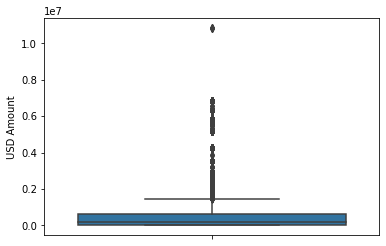

In [20]:
sns.boxplot(y=hist_df['USD Amount'])
plt.show()

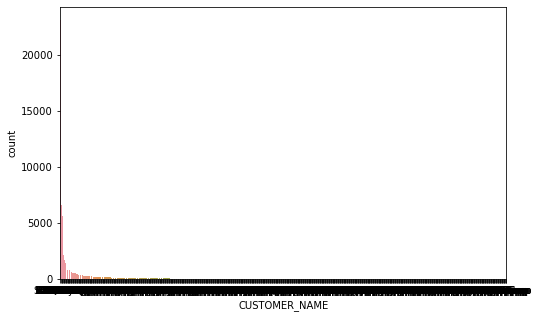

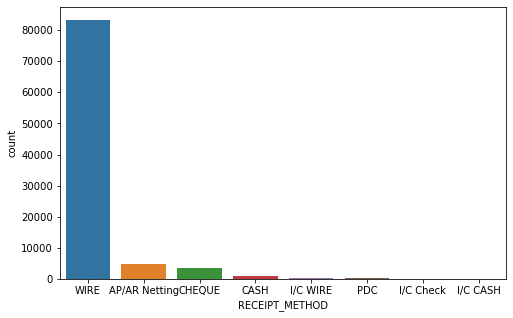

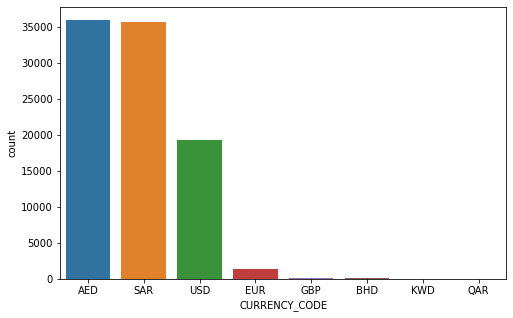

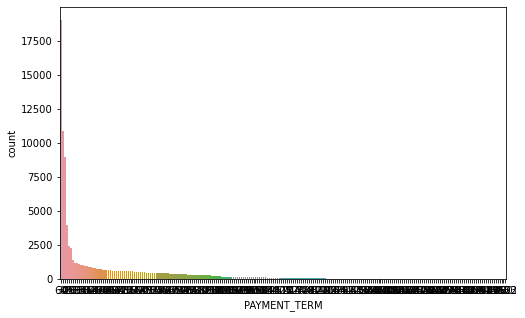

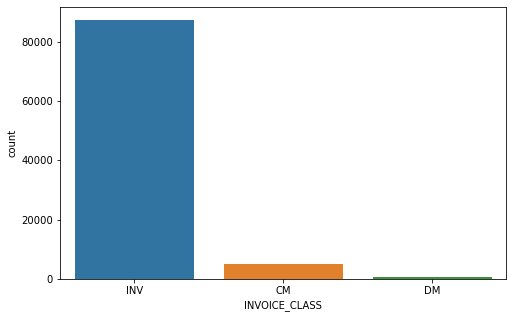

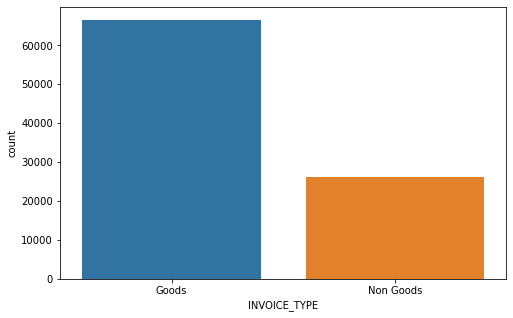

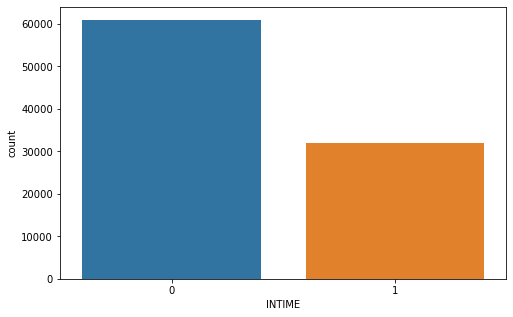

In [21]:
# Visualizing all the categorical variables
j=1
for i in ctgr_vars:
    plt.figure(figsize=(8,5))
    sns.countplot(x = i,data = hist_df,order = hist_df[i].value_counts().index)
    j+=1
    plt.show()

### Inferences from Univariate analysis:
#### 1. RECEIPT_METHOD : We can see that 'WIRE' transfer followed by 'AP/AR Netting' is the highest receipt method
#### 2. CURRENCY_CODE : We can see that 'AED' followed by 'SAR' and 'USD' is the most frequently used currency
#### 3. INVOICE_CLASS : We can see the 'INV' (Invoice) followed by (CM) Credit Memo or Credit Note and then by (DM) Debit Memo or Debit Note      
#### 4. INVOICE_TYPE : Goods are the most invoiced type.
#### 5. INTIME: 34.35 % of the payment happen on time and more than 65.65 % of payments that are delayed

## Bivariate and Multivariate analysis

### Visualizing top 20 customers in terms of million dollar amount
- Since the customer count is 689 we cannot visualize all in one plot

In [22]:
hist_df.CUSTOMER_NAME.nunique()

689

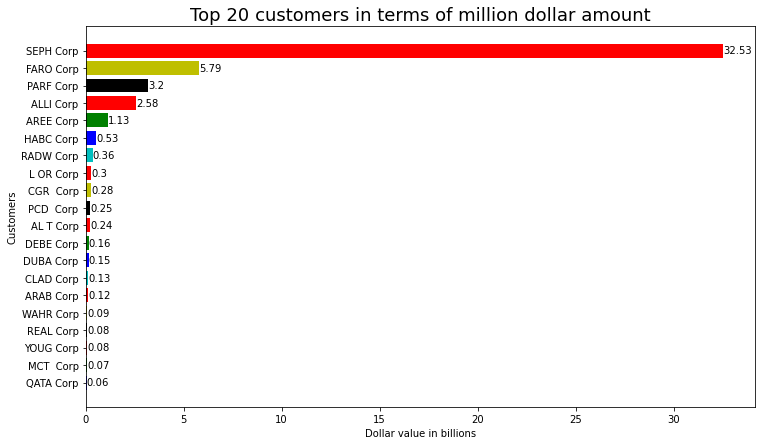

In [23]:
temp1 = hist_df.groupby(['CUSTOMER_NAME'])['USD Amount'].sum()
temp1 = temp1.to_frame()
temp1 = temp1.sort_values(by ='USD Amount',ascending=False)
temp1 = temp1.head(20)
temp1 = temp1.sort_values(by ='USD Amount',ascending=True)
temp1.reset_index(inplace=True)
colours = ['b','g','r','k','y','r','c']
fig, ax = plt.subplots(figsize=(12,7))
bars = ax.barh(temp1.CUSTOMER_NAME,round(temp1['USD Amount']/1000000000,2),color = colours)
plt.title("Top 20 customers in terms of million dollar amount",fontsize=18)
ax.set_ylabel('Customers')
ax.set_xlabel('Dollar value in billions')
ax.bar_label(bars)
plt.show()

#### We can see SEPH Corp,FARO Corp,PARF corp,ALLI Corp and AREE Corp are the top customers across 2015 - 2021

### Visualizing the total yearly transactions by year for the company

In [24]:
plot_df = hist_df.copy()

In [25]:
plot_df['Year'] = plot_df.INVOICE_CREATION_DATE.dt.year
plot_df['Month'] = plot_df.INVOICE_CREATION_DATE.dt.month

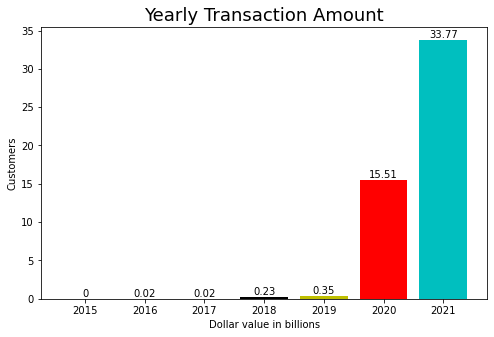

In [26]:
temp2 = plot_df.groupby(['Year'])['USD Amount'].sum()
temp2 = temp2.to_frame()
temp2.reset_index(inplace=True)
colours = ['b','g','r','k','y','r','c']
fig, ax = plt.subplots(figsize=(8,5))
bars = ax.bar(temp2.Year,round(temp2['USD Amount']/1000000000,2),color = colours)
plt.title("Yearly Transaction Amount",fontsize=18)
ax.set_ylabel('Customers')
ax.set_xlabel('Dollar value in billions')
ax.bar_label(bars)
plt.show()

#### We can see that the company's businees has grown exponentially over the years

#### Visualizing the monthly transaction by year for the company

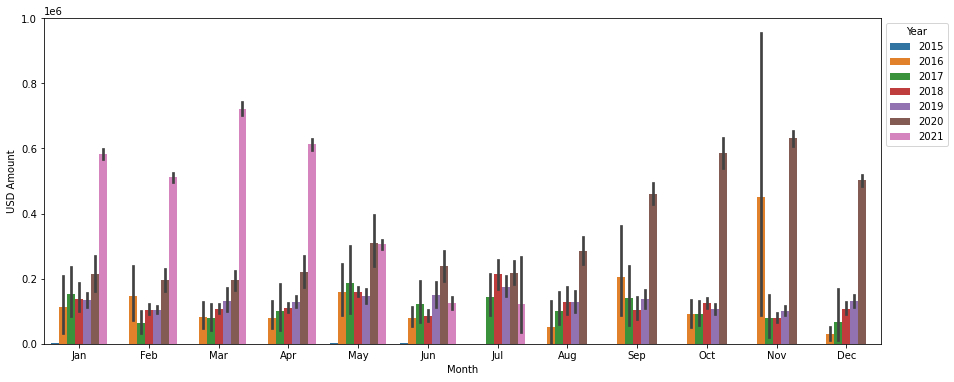

In [27]:
from calendar import month_abbr as months
months1 = list(months)[1:]

fig, ax = plt.subplots(figsize=(15,6))

sns.barplot(x=hist_df.INVOICE_CREATION_DATE.dt.month, y=hist_df['USD Amount'], hue=hist_df.INVOICE_CREATION_DATE.dt.year, ax=ax)
ax.legend(title='Year', bbox_to_anchor=(1, 1), loc='upper left')
ax.set(xlabel='Month',xticklabels=months1)  # setting the xticklabels is optional
plt.show()

In [28]:
months

#### We can see that in the past couple of years there is an increasing trend in transactions. The first 4 months of 2021 has dominated for the year on year monthly data. However, May June and July has shown reduction compared to previous year.

In [29]:
temp2 = plot_df.groupby(['Year','Month'])['USD Amount'].sum()
temp2 = temp2.to_frame()
temp2.reset_index(inplace=True)
temp2.head()

,Year,Month,USD Amount
0,2015,1,1.645043e+03
1,2015,5,7.001999e+03
2,2015,6,2.499370e+03
3,2016,1,1.476106e+06
4,2016,2,2.637756e+06


#### Monthly sales across the years

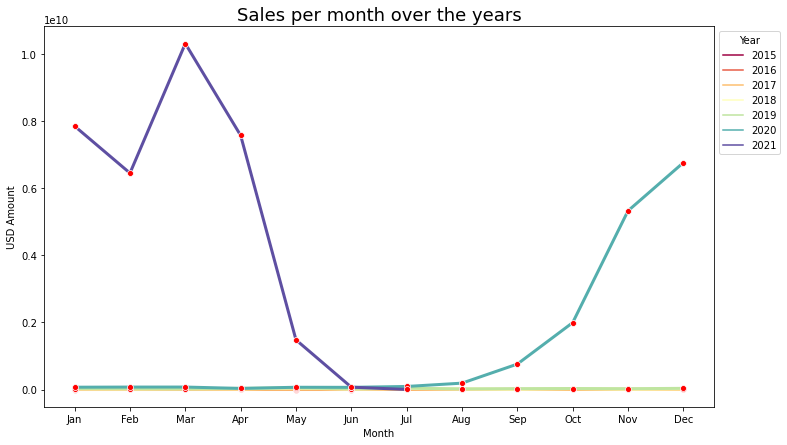

In [30]:
#from calendar import month_abbr as months
months2 = list(months)[1:]
temp4 = plot_df.groupby(['Year','Month'])['USD Amount'].sum()
temp4 = temp4.to_frame()
temp4.reset_index(inplace=True)
#temp4.head()
fig, ax = plt.subplots(figsize=(12,7))
sns.lineplot(x=temp4['Month'], y=temp4['USD Amount'], hue=temp4['Year'],palette = 'Spectral' ,data=temp4,ax=ax,linewidth=3,markerfacecolor = 'red', markersize = 6,marker = 'o')
ax.legend(title='Year', bbox_to_anchor=(1, 1), loc='upper left')
ax.set_xticks(range(1,13))
plt.title('Sales per month over the years',fontsize=(18))
ax.set(xlabel='Month',xticklabels=months2)# setting the xticklabels is optional
plt.show()

#### We can see that 2021 and 2020 the transactions in terms of USD Amout has been great. However we see there is a dip since April 2021.

In [31]:
#### Increase in yearly transaction count.

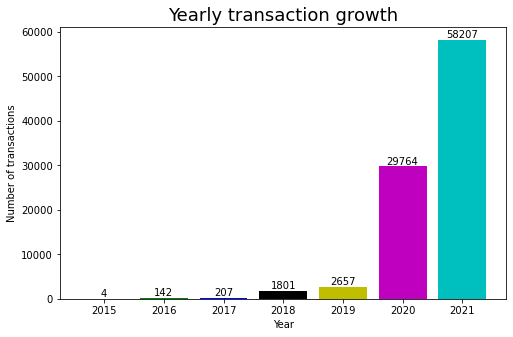

In [32]:
temp2 = plot_df.groupby(['Year']).count()['INTIME']
temp2 = temp2.to_frame()
temp2.reset_index(inplace=True)
colours = ['r','g','b','k','y','m','c']
fig, ax = plt.subplots(figsize=(8,5))
bars = ax.bar(temp2['Year'],temp2.INTIME,color = colours)
ax.set_ylabel('Number of transactions')
plt.title("Yearly transaction growth",fontsize=(18))
ax.set_xlabel('Year')
ax.bar_label(bars)
plt.show()

#### We can see the transactions have increased exponentially

#### Visualizing the Ontime vs Late payment for top 20 customer.

<function matplotlib.pyplot.show(close=None, block=None)>

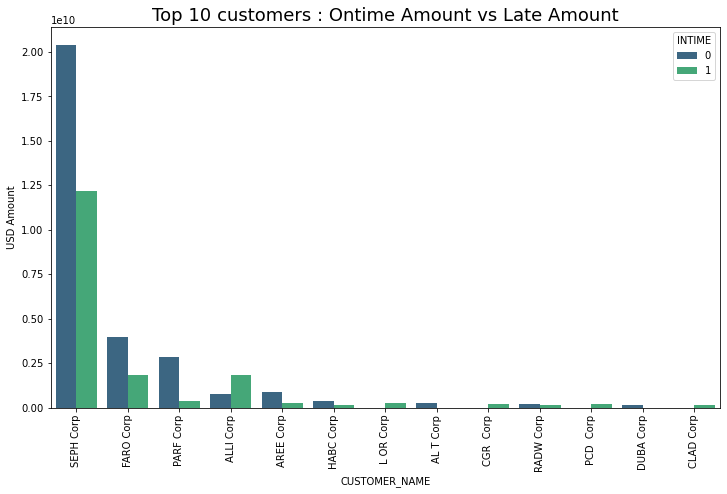

In [33]:
#Visualizing the Ontime vs Late payment for top 20 customer.
temp3 = hist_df.groupby(['INTIME','CUSTOMER_NAME']).sum()['USD Amount']
temp3 = temp3.reset_index()
temp3 = temp3.sort_values(by ='USD Amount',ascending=False)
temp3 = temp3.head(20)
temp3 = temp3.sort_values(by ='USD Amount',ascending=False)
temp3.reset_index(inplace=True)
plt.figure(figsize=(12,7))
plt.xticks(rotation=90)
plt.title("Top 10 customers : Ontime Amount vs Late Amount",fontsize=(18))
sns.barplot(temp3.CUSTOMER_NAME,temp3['USD Amount'],hue ='INTIME',data=temp3,palette = 'viridis')
plt.show

#### We can see that accross the top 10 customers, In dollar amount terms they have higher late payment than on time payment.

<AxesSubplot:title={'center':'Payment pattern based on currency'}, xlabel='CURRENCY_CODE', ylabel='USD Amount'>

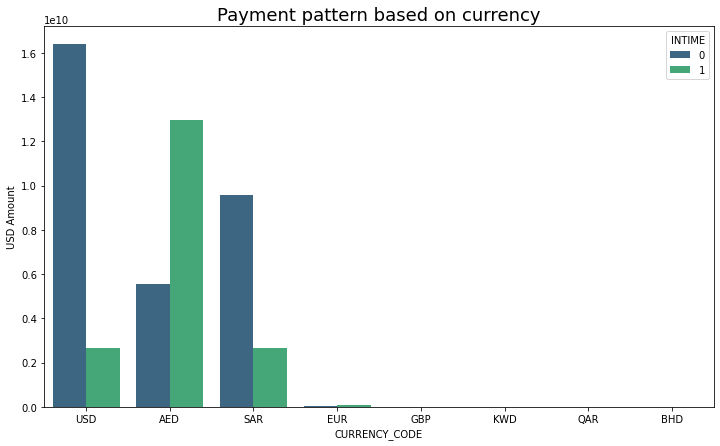

In [34]:
#Visualizing the payment pattern base on currency code.
temp = hist_df.groupby(['INTIME','CURRENCY_CODE']).sum()['USD Amount']
temp = temp.reset_index()
temp = temp.sort_values(by ='USD Amount',ascending=False)
  # plot barplot
plt.figure(figsize=(12,7))
plt.title("Payment pattern based on currency",fontsize=(18))
sns.barplot(x="CURRENCY_CODE",y="USD Amount",hue ='INTIME',data=temp,palette = 'viridis')

#### Even though USD is the 3rd most frequently used currency for payment. The highest amount in terms of late payment is in USD.This means that customers in the USA are have done the most late payment.Even customer using SAR (South African Rand) and AED(Australian Dollar) have a high amount of dollars paid late. 

#### Ontime vs Late payment based on payment method.

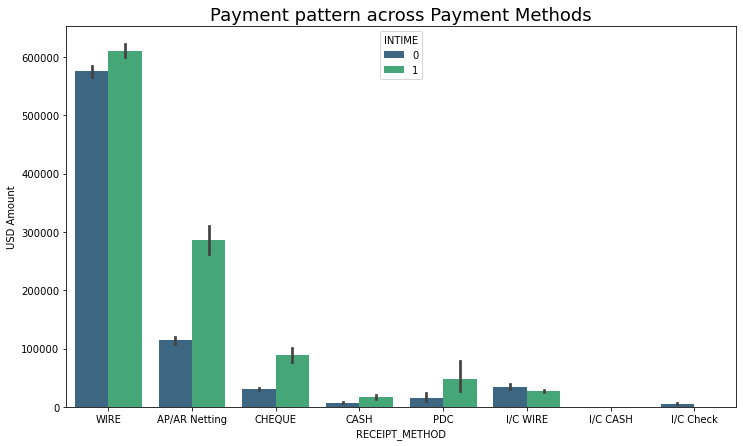

In [35]:
plt.figure(figsize=(12,7))
sns.barplot(x='RECEIPT_METHOD',y='USD Amount',data=hist_df,hue='INTIME',palette = 'viridis')
plt.title("Payment pattern across Payment Methods",fontsize=(18))
plt.show()

 #### Even though WIRE transfer is the preferred route of payment, AP/AR Netting followed by CHEQUE seems to be good in terms of ratio for payments on time vs late payments. AP/AR netting: Definition :AP/AR netting allows you to net your Payable invoice balances against your Receivables invoice balances for those Customers who are also your Suppliers. Thus offsetting customer receivables agains payables could be a good strategy to get payments on time. Also, encouraging CHEQUE payments could be a good strategy.

In [36]:
hist_df.columns

Index(['RECEIPT_METHOD', 'CUSTOMER_NAME', 'CUSTOMER_NUMBER', 'RECEIPT_DOC_NO',
       'RECEIPT_DATE', 'CLASS', 'CURRENCY_CODE', 'Local Amount', 'USD Amount',
       'INVOICE_ALLOCATED', 'INVOICE_CREATION_DATE', 'DUE_DATE',
       'INVOICE_CLASS', 'INVOICE_CURRENCY_CODE', 'INVOICE_TYPE', 'INTIME',
       'PAYMENT_TERM'],
      dtype='object')

In [37]:
#Checking for null

In [38]:
hist_df.isnull().sum()

RECEIPT_METHOD           0
CUSTOMER_NAME            0
CUSTOMER_NUMBER          0
RECEIPT_DOC_NO           0
RECEIPT_DATE             0
CLASS                    0
CURRENCY_CODE            0
Local Amount             0
USD Amount               0
INVOICE_ALLOCATED        0
INVOICE_CREATION_DATE    0
DUE_DATE                 0
INVOICE_CLASS            0
INVOICE_CURRENCY_CODE    0
INVOICE_TYPE             0
INTIME                   0
PAYMENT_TERM             0
dtype: int64

In [39]:
hist_df[hist_df['RECEIPT_DOC_NO'].isna()][['RECEIPT_DATE','DUE_DATE','RECEIPT_DOC_NO']]


,RECEIPT_DATE,DUE_DATE,RECEIPT_DOC_NO


In [40]:
#rows without RECEIPT_DOC_NO data
hist_df.iloc[93908:93936,:]

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM


In [41]:
hist_df[hist_df['RECEIPT_DOC_NO'] == 1.510000e+11].head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM
33328,WIRE,ABDU Corp,34640,1.510000e+11,2021-01-03,PMT,SAR,13146.00,3504.899691,1.512E+11,2020-11-18,2020-12-25,INV,SAR,Goods,0,37
33329,WIRE,BOST Corp,34259,1.510000e+11,2021-01-03,PMT,SAR,13146.00,3504.899691,1.5119E+11,2019-09-19,2019-10-04,INV,SAR,Goods,0,15
33330,WIRE,ABDU Corp,34640,1.510000e+11,2021-01-03,PMT,SAR,13146.00,3504.899691,1.512E+11,2020-11-18,2020-12-25,INV,SAR,Goods,0,37
33331,WIRE,ABDU Corp,34640,1.510000e+11,2021-01-03,PMT,SAR,14334.54,3821.780375,1.512E+11,2020-11-18,2020-12-25,INV,SAR,Goods,0,37
33332,WIRE,CUTE Corp,34260,1.510000e+11,2021-01-03,PMT,SAR,23470.00,6257.416381,1.5119E+11,2019-05-09,2019-06-15,INV,SAR,Goods,0,37


In [42]:
#Analysing the Open_Invoice_data

In [43]:
open_df = pd.read_csv('Open_Invoice_data.csv',encoding = 'ISO-8859-1')

In [44]:
open_df[open_df['Transaction Class'] == 'PAYMENT']['AGE'].min()

-71

In [45]:
open_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88204 entries, 0 to 88203
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   AS_OF_DATE            88204 non-null  object 
 1   Customer Type         88204 non-null  object 
 2   Customer_Name         88204 non-null  object 
 3   Customer Account No   88201 non-null  float64
 4   Transaction Number    88195 non-null  object 
 5   Transaction Date      88204 non-null  object 
 6   Payment Term          88204 non-null  object 
 7   Due Date              88204 non-null  object 
 8   Transaction Currency  88204 non-null  object 
 9   Local Amount          88204 non-null  object 
 10  Transaction Class     88204 non-null  object 
 11  AGE                   88204 non-null  int64  
 12  USD Amount            88204 non-null  object 
 13  INV_CREATION_DATE     88204 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 9.4+ MB


In [46]:
hist_df.INVOICE_CLASS.unique()

array(['INV', 'CM', 'DM'], dtype=object)

In [47]:
open_df['Customer Type'].unique()

array(['3rd Party', 'Related Party', 'Unidentified Receipts'],
      dtype=object)

In [48]:
open_df.head()

,AS_OF_DATE,Customer Type,Customer_Name,Customer Account No,Transaction Number,Transaction Date,Payment Term,Due Date,Transaction Currency,Local Amount,Transaction Class,AGE,USD Amount,INV_CREATION_DATE
0,04-APR-2022 01:07:01,3rd Party,GIVE Corp,49144.0,100210000438,21/12/2021,Immediate,21/12/2021,AED,"-3,088",CREDIT NOTE,105,"-3,088",12/21/2021 12:53
1,04-APR-2022 01:07:01,Related Party,AL J Corp,23152.0,100220000052,01/02/2022,30 Days from Inv Date,03/03/2022,USD,"2,000",INVOICE,33,"2,000",2/1/2022 14:09
2,04-APR-2022 01:07:01,Related Party,AL J Corp,23152.0,100220000143,24/03/2022,30 Days from Inv Date,23/04/2022,USD,"2,000",INVOICE,-18,"2,000",3/24/2022 17:46
3,04-APR-2022 01:07:01,Related Party,AL R Corp,23312.0,100220000001,04/01/2022,15 Days from Inv Date,19/01/2022,AED,"2,415",INVOICE,76,"2,415",1/5/2022 11:49
4,04-APR-2022 01:07:01,Related Party,ALLI Corp,7530.0,100220000105,03/03/2022,30 Days from EOM,30/04/2022,AED,"3,800",INVOICE,-25,"3,800",3/3/2022 22:30


In [49]:
open_df.columns

Index(['AS_OF_DATE', 'Customer Type', 'Customer_Name', 'Customer Account No',
       'Transaction Number', 'Transaction Date', 'Payment Term', 'Due Date',
       'Transaction Currency', 'Local Amount', 'Transaction Class', 'AGE',
       'USD Amount', 'INV_CREATION_DATE'],
      dtype='object')

In [50]:
open_df.shape

(88204, 14)

In [51]:
hist_df.columns

Index(['RECEIPT_METHOD', 'CUSTOMER_NAME', 'CUSTOMER_NUMBER', 'RECEIPT_DOC_NO',
       'RECEIPT_DATE', 'CLASS', 'CURRENCY_CODE', 'Local Amount', 'USD Amount',
       'INVOICE_ALLOCATED', 'INVOICE_CREATION_DATE', 'DUE_DATE',
       'INVOICE_CLASS', 'INVOICE_CURRENCY_CODE', 'INVOICE_TYPE', 'INTIME',
       'PAYMENT_TERM'],
      dtype='object')

# Clustering using KMeans

In [52]:
hist_df.head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM
0,WIRE,C EA Corp,37403,1.421000e+10,2021-04-20,PMT,USD,370990.92,101018.63040,14200000001,2020-11-02,2020-12-30,INV,AED,Non Goods,0,58
1,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,183750.00,48990.21133,99200000043,2020-12-29,2021-01-28,INV,SAR,Non Goods,0,30
2,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99210000003,2021-01-30,2021-03-01,INV,SAR,Non Goods,1,30
3,WIRE,FARO Corp,1409,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000038,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30
4,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000039,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30


In [53]:
hist_df.shape

(92782, 17)

In [54]:
clustering_df = hist_df [['CUSTOMER_NAME','RECEIPT_DATE','USD Amount','INVOICE_CREATION_DATE','DUE_DATE','PAYMENT_TERM']]

In [55]:
clustering_df.head()

,CUSTOMER_NAME,RECEIPT_DATE,USD Amount,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM
0,C EA Corp,2021-04-20,101018.63040,2020-11-02,2020-12-30,58
1,RADW Corp,2021-01-31,48990.21133,2020-12-29,2021-01-28,30
2,RADW Corp,2021-01-31,41991.60971,2021-01-30,2021-03-01,30
3,FARO Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30
4,RADW Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30


In [56]:
clustering_df['PAYMENT_DAYS'] = (hist_df['DUE_DATE'] - hist_df['RECEIPT_DATE']).dt.days

In [57]:
clustering_df.head()

,CUSTOMER_NAME,RECEIPT_DATE,USD Amount,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,PAYMENT_DAYS
0,C EA Corp,2021-04-20,101018.63040,2020-11-02,2020-12-30,58,-111
1,RADW Corp,2021-01-31,48990.21133,2020-12-29,2021-01-28,30,-3
2,RADW Corp,2021-01-31,41991.60971,2021-01-30,2021-03-01,30,29
3,FARO Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30,-17
4,RADW Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30,-17


In [58]:
clustering_df['AVG_PAYMENT_DAYS'] = round(clustering_df.groupby(by='CUSTOMER_NAME')['PAYMENT_DAYS'].transform('mean'))

In [59]:
clustering_df.head()

,CUSTOMER_NAME,RECEIPT_DATE,USD Amount,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,PAYMENT_DAYS,AVG_PAYMENT_DAYS
0,C EA Corp,2021-04-20,101018.63040,2020-11-02,2020-12-30,58,-111,-52.0
1,RADW Corp,2021-01-31,48990.21133,2020-12-29,2021-01-28,30,-3,-12.0
2,RADW Corp,2021-01-31,41991.60971,2021-01-30,2021-03-01,30,29,-12.0
3,FARO Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30,-17,-108.0
4,RADW Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30,-17,-12.0


In [60]:
clustering_df['SD_AVG_PAYMENT'] = clustering_df.groupby(by='CUSTOMER_NAME')['PAYMENT_DAYS'].transform(np.std)

In [61]:
clustering_df.head()

,CUSTOMER_NAME,RECEIPT_DATE,USD Amount,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,PAYMENT_DAYS,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT
0,C EA Corp,2021-04-20,101018.63040,2020-11-02,2020-12-30,58,-111,-52.0,61.098281
1,RADW Corp,2021-01-31,48990.21133,2020-12-29,2021-01-28,30,-3,-12.0,47.748335
2,RADW Corp,2021-01-31,41991.60971,2021-01-30,2021-03-01,30,29,-12.0,47.748335
3,FARO Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30,-17,-108.0,260.549271
4,RADW Corp,2021-01-31,41991.60971,2020-12-15,2021-01-14,30,-17,-12.0,47.748335


In [62]:
clustering_df.shape

(92782, 9)

In [63]:
# Visualizing the AVG_PAYMENT_DAYS and SD_AVG_PAYMENT for customers

#### Visualing the top 15 Customers who have the best payment history vs customers with bad payment history

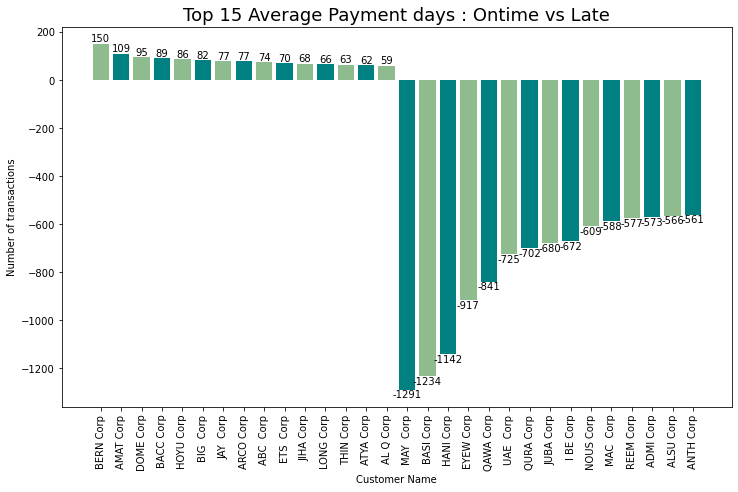

In [64]:
# Visualing the top 15 Customers who have the best payment history vs customers with bad payment history
temp8 = clustering_df.groupby(['CUSTOMER_NAME']).mean()['AVG_PAYMENT_DAYS']
temp8 = temp8.reset_index()
temp8 = temp8.sort_values(by ='AVG_PAYMENT_DAYS',ascending=False)
temp6 = temp8.head(15)
temp7 = temp8.sort_values(by ='AVG_PAYMENT_DAYS',ascending=True)
temp7 = temp7.head(15)
temp6 = temp6.append(temp7, ignore_index=True)
colours = ['darkseagreen','teal']
#colours = ['r','g','b','k','y','m','c']
fig, ax = plt.subplots(figsize=(12,7))
bars = ax.bar(temp6['CUSTOMER_NAME'],temp6.AVG_PAYMENT_DAYS,color = colours)
ax.set_ylabel('Number of transactions')
ax.set_xlabel('Customer Name')
plt.title("Top 15 Average Payment days : Ontime vs Late",fontsize=(18))
plt.xticks(rotation=90)
ax.bar_label(bars)
plt.show()

### The below Customers have the best record in terms of AVG payment days
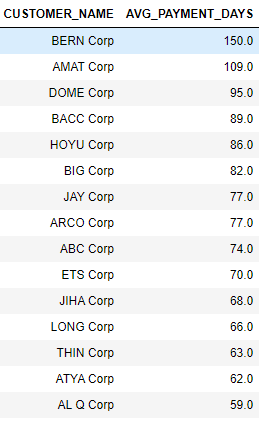

### The below Customers have the worst record in terms of AVG payment days
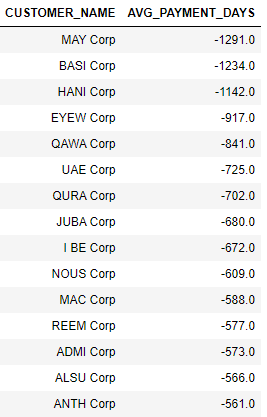

In [65]:
clstr = clustering_df[['CUSTOMER_NAME','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']]

In [66]:
clstr.head()

,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT
0,C EA Corp,-52.0,61.098281
1,RADW Corp,-12.0,47.748335
2,RADW Corp,-12.0,47.748335
3,FARO Corp,-108.0,260.549271
4,RADW Corp,-12.0,47.748335


In [67]:
clstr.isnull().sum()

CUSTOMER_NAME        0
AVG_PAYMENT_DAYS     0
SD_AVG_PAYMENT      86
dtype: int64

In [68]:
#When PAYMENT_DAYS and AVG_PAYMENT_DAYS are same standard devaition will be the same.
# We can impute the 0 here as "A standard deviation of zero indicates that data points are on the mean"

In [69]:
clstr.fillna(value=0,inplace=True)

In [70]:
# Checking for nulls in derived SD_AVG_PAYMENT column

In [71]:
clstr[clstr.SD_AVG_PAYMENT.isna()].head()

,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT


In [72]:
# Scaling the variable using StandardScaler

In [73]:
from sklearn.preprocessing import StandardScaler

In [74]:
scaler_sd = StandardScaler()

In [75]:
clstr_SS = scaler_sd.fit_transform(clstr.iloc[:,1:])

In [76]:
clstr_SS = pd.DataFrame(clstr_SS)

In [77]:
clstr_SS

,0,1
0,0.189175,-0.791733
1,0.735746,-0.917726
2,0.735746,-0.917726
3,-0.576026,1.090623
4,0.735746,-0.917726
5,-0.576026,1.090623
6,0.735746,-0.917726
7,0.735746,-0.917726
8,-0.576026,1.090623
9,0.735746,-0.917726


In [78]:
clstr_SS_merged = pd.concat([clstr['CUSTOMER_NAME'],clstr_SS],axis=1)

In [79]:
## Performing KMeans clustering

In [80]:
from sklearn.cluster import KMeans

In [81]:
kmeans = KMeans(n_clusters = 3,max_iter=50,random_state=100)

In [82]:
kmeans.fit(clstr_SS)

KMeans(max_iter=50, n_clusters=3, random_state=100)

In [83]:
len(kmeans.labels_)

92782

In [84]:
c = [2,3,4,5,6,7,8]
ssd = []
for clusters in c:
    kmeans = KMeans(n_clusters=clusters,max_iter=50,random_state=100)
    kmeans.fit(clstr_SS)
    ssd.append(kmeans.inertia_)

In [85]:
print(ssd)

[81809.84900571375, 49785.96916168886, 29670.974286692053, 21492.03740817516, 17158.030392963454, 13647.319683658065, 11704.894179102479]


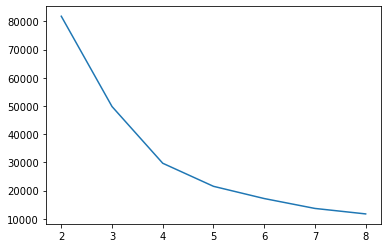

In [86]:
## plot the sum fo square distances SSD's
plt.plot(c,ssd)
plt.show()


In [87]:
## We can infer that 4 clusters are optimum

In [88]:
## Silhouette Analysis to check our infernce of 4 clusters
from sklearn.metrics import silhouette_score

In [89]:
sil_clstrs = [2,3,4,5,6,7,8]
for clusters in sil_clstrs:
    kmeans = KMeans(n_clusters=clusters,max_iter=50,random_state=100)
    kmeans.fit(clstr_SS)
    cluster_labels = kmeans.labels_
    ##silhoutte score
    sil_avg = silhouette_score(clstr_SS,cluster_labels)
    print("For {0} clusters the silhouette score is {1}".format(clusters,sil_avg))

For 2 clusters the silhouette score is 0.6340920351650735
For 3 clusters the silhouette score is 0.6133982830731707
For 4 clusters the silhouette score is 0.6936520292787695
For 5 clusters the silhouette score is 0.7116520567435337
For 6 clusters the silhouette score is 0.7031101377095617
For 7 clusters the silhouette score is 0.7057780822403708
For 8 clusters the silhouette score is 0.7128789249278543


In [90]:
# Even though silhoutte score is highest for 5 clusters. We can have decided that we want to consider 4 clusters as 5 clusters would be too many clusters for our analysis

In [91]:
### Final model with K=4
kmeans = KMeans(n_clusters=4,max_iter =50,random_state=100)
kmeans.fit(clstr_SS)

KMeans(max_iter=50, n_clusters=4, random_state=100)

In [92]:
kmeans.labels_

array([1, 1, 1, ..., 1, 1, 1])

In [93]:
clstr_SS.head()

,0,1
0,0.189175,-0.791733
1,0.735746,-0.917726
2,0.735746,-0.917726
3,-0.576026,1.090623
4,0.735746,-0.917726


In [94]:
clstr['CLUSTER_ID'] = kmeans.labels_

In [95]:
clstr.head()

,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,C EA Corp,-52.0,61.098281,1
1,RADW Corp,-12.0,47.748335,1
2,RADW Corp,-12.0,47.748335,1
3,FARO Corp,-108.0,260.549271,2
4,RADW Corp,-12.0,47.748335,1


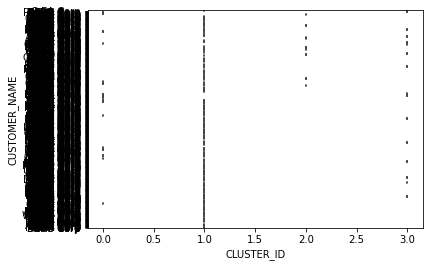

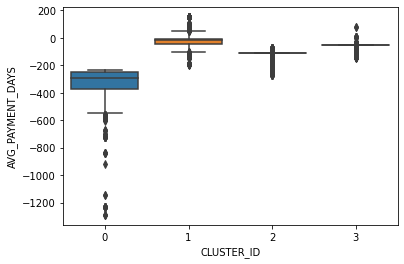

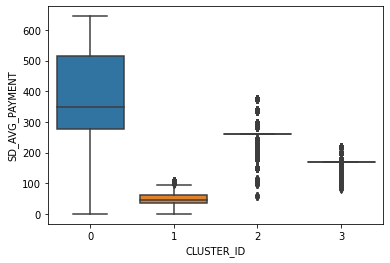

In [96]:
for c in clstr.columns:
    if c != 'CLUSTER_ID':
        sns.boxplot(x='CLUSTER_ID',y= c,data=clstr)
        plt.show()

# Insights from K means clusterting

#### From our clustering analysis we can make the following infrence
- Customers in cluster 0 has the highest average payment days, so that might be the ones that make a late payement
- Customers in cluster 2 has the second highest average payment days followed by cluster 3.
- Customers in cluster 1 have the lowest average payment days and are more likely to make payements on time.

In [97]:
## Logistic Regression

In [98]:
hist_df.head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM
0,WIRE,C EA Corp,37403,1.421000e+10,2021-04-20,PMT,USD,370990.92,101018.63040,14200000001,2020-11-02,2020-12-30,INV,AED,Non Goods,0,58
1,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,183750.00,48990.21133,99200000043,2020-12-29,2021-01-28,INV,SAR,Non Goods,0,30
2,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99210000003,2021-01-30,2021-03-01,INV,SAR,Non Goods,1,30
3,WIRE,FARO Corp,1409,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000038,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30
4,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000039,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30


In [99]:
clstr.head()

,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,C EA Corp,-52.0,61.098281,1
1,RADW Corp,-12.0,47.748335,1
2,RADW Corp,-12.0,47.748335,1
3,FARO Corp,-108.0,260.549271,2
4,RADW Corp,-12.0,47.748335,1


In [100]:
merged_df = pd.merge(hist_df, clstr[['AVG_PAYMENT_DAYS','SD_AVG_PAYMENT','CLUSTER_ID']], left_index=True, right_index=True)

In [101]:
merged_df.head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,WIRE,C EA Corp,37403,1.421000e+10,2021-04-20,PMT,USD,370990.92,101018.63040,14200000001,2020-11-02,2020-12-30,INV,AED,Non Goods,0,58,-52.0,61.098281,1
1,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,183750.00,48990.21133,99200000043,2020-12-29,2021-01-28,INV,SAR,Non Goods,0,30,-12.0,47.748335,1
2,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99210000003,2021-01-30,2021-03-01,INV,SAR,Non Goods,1,30,-12.0,47.748335,1
3,WIRE,FARO Corp,1409,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000038,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30,-108.0,260.549271,2
4,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000039,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30,-12.0,47.748335,1


In [102]:
## applying labels to clustering data.
merged_df.CLUSTER_ID = merged_df.CLUSTER_ID.apply(lambda x : 'TIMELY' if x == 1 else('LATE' if x==0 else 'CANTSAY'))

In [103]:
merged_df.head()

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,RECEIPT_DOC_NO,RECEIPT_DATE,CLASS,CURRENCY_CODE,Local Amount,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,INTIME,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,WIRE,C EA Corp,37403,1.421000e+10,2021-04-20,PMT,USD,370990.92,101018.63040,14200000001,2020-11-02,2020-12-30,INV,AED,Non Goods,0,58,-52.0,61.098281,TIMELY
1,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,183750.00,48990.21133,99200000043,2020-12-29,2021-01-28,INV,SAR,Non Goods,0,30,-12.0,47.748335,TIMELY
2,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99210000003,2021-01-30,2021-03-01,INV,SAR,Non Goods,1,30,-12.0,47.748335,TIMELY
3,WIRE,FARO Corp,1409,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000038,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30,-108.0,260.549271,CANTSAY
4,WIRE,RADW Corp,4003,9.921000e+10,2021-01-31,PMT,SAR,157500.00,41991.60971,99200000039,2020-12-15,2021-01-14,INV,SAR,Non Goods,0,30,-12.0,47.748335,TIMELY


## Dropping the following columns as they  not  relevant for model building
RECEIPT_DOC_NO - This column being the ref number assigned by the company is not relevant customer data.
RECEIPT_DATE - We have already derived the AVG_PAYMENT_DAYS from this date
CLASS - This value is the same for all the rows
Local Amount - Since all amounts are converted to USD(creating uniformity), we can remove this column
INVOICE_ALLOCATED - This is not unique per transaction nor for particular dates, also this is assigned by the company
INVOICE_CREATION_DATE - We have already derived the PAYMENT_TERM from this date
DUE_DATE - We have already derived the PAYMENT_TERM from this date
INVOICE_CURRENCY_CODE - Connected to invoice generated by the company and not customer data


In [104]:
#Dropping the above columns
drop_cols = ['INVOICE_TYPE','RECEIPT_METHOD','RECEIPT_DOC_NO','RECEIPT_DATE','CLASS','Local Amount','INVOICE_ALLOCATED','INVOICE_CREATION_DATE','DUE_DATE','INVOICE_CURRENCY_CODE']

In [105]:
merged_df.drop(columns = drop_cols,axis=1,inplace= True)

In [106]:
merged_df.columns

Index(['CUSTOMER_NAME', 'CUSTOMER_NUMBER', 'CURRENCY_CODE', 'USD Amount',
       'INVOICE_CLASS', 'INTIME', 'PAYMENT_TERM', 'AVG_PAYMENT_DAYS',
       'SD_AVG_PAYMENT', 'CLUSTER_ID'],
      dtype='object')

In [107]:
merged_df.head()

,CUSTOMER_NAME,CUSTOMER_NUMBER,CURRENCY_CODE,USD Amount,INVOICE_CLASS,INTIME,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,C EA Corp,37403,USD,101018.63040,INV,0,58,-52.0,61.098281,TIMELY
1,RADW Corp,4003,SAR,48990.21133,INV,0,30,-12.0,47.748335,TIMELY
2,RADW Corp,4003,SAR,41991.60971,INV,1,30,-12.0,47.748335,TIMELY
3,FARO Corp,1409,SAR,41991.60971,INV,0,30,-108.0,260.549271,CANTSAY
4,RADW Corp,4003,SAR,41991.60971,INV,0,30,-12.0,47.748335,TIMELY


In [108]:
merged_df[merged_df['USD Amount'] == 0 ]

,CUSTOMER_NAME,CUSTOMER_NUMBER,CURRENCY_CODE,USD Amount,INVOICE_CLASS,INTIME,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID


In [109]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy_df = pd.get_dummies(merged_df[['CURRENCY_CODE', 'INVOICE_CLASS','CLUSTER_ID']], drop_first=True)

In [110]:
dummy_df.head()

,CURRENCY_CODE_BHD,CURRENCY_CODE_EUR,CURRENCY_CODE_GBP,CURRENCY_CODE_KWD,CURRENCY_CODE_QAR,CURRENCY_CODE_SAR,CURRENCY_CODE_USD,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
0,0,0,0,0,0,0,1,0,1,0,1
1,0,0,0,0,0,1,0,0,1,0,1
2,0,0,0,0,0,1,0,0,1,0,1
3,0,0,0,0,0,1,0,0,1,0,0
4,0,0,0,0,0,1,0,0,1,0,1


In [111]:
# Adding the results to the master dataframe
merged_df = pd.concat([merged_df, dummy_df], axis=1)

In [112]:
merged_df.drop(columns = ['CURRENCY_CODE', 'INVOICE_CLASS','CLUSTER_ID'],axis=1,inplace=True)

In [113]:
merged_df.head()

,CUSTOMER_NAME,CUSTOMER_NUMBER,USD Amount,INTIME,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CURRENCY_CODE_BHD,CURRENCY_CODE_EUR,CURRENCY_CODE_GBP,CURRENCY_CODE_KWD,CURRENCY_CODE_QAR,CURRENCY_CODE_SAR,CURRENCY_CODE_USD,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
0,C EA Corp,37403,101018.63040,0,58,-52.0,61.098281,0,0,0,0,0,0,1,0,1,0,1
1,RADW Corp,4003,48990.21133,0,30,-12.0,47.748335,0,0,0,0,0,1,0,0,1,0,1
2,RADW Corp,4003,41991.60971,1,30,-12.0,47.748335,0,0,0,0,0,1,0,0,1,0,1
3,FARO Corp,1409,41991.60971,0,30,-108.0,260.549271,0,0,0,0,0,1,0,0,1,0,0
4,RADW Corp,4003,41991.60971,0,30,-12.0,47.748335,0,0,0,0,0,1,0,0,1,0,1


In [114]:
from sklearn.model_selection import train_test_split

In [115]:
# Putting feature variable to X
X = merged_df.drop(['INTIME','CUSTOMER_NAME','CUSTOMER_NUMBER'], axis=1)

X.head()

,USD Amount,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CURRENCY_CODE_BHD,CURRENCY_CODE_EUR,CURRENCY_CODE_GBP,CURRENCY_CODE_KWD,CURRENCY_CODE_QAR,CURRENCY_CODE_SAR,CURRENCY_CODE_USD,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
0,101018.63040,58,-52.0,61.098281,0,0,0,0,0,0,1,0,1,0,1
1,48990.21133,30,-12.0,47.748335,0,0,0,0,0,1,0,0,1,0,1
2,41991.60971,30,-12.0,47.748335,0,0,0,0,0,1,0,0,1,0,1
3,41991.60971,30,-108.0,260.549271,0,0,0,0,0,1,0,0,1,0,0
4,41991.60971,30,-12.0,47.748335,0,0,0,0,0,1,0,0,1,0,1


In [116]:
# Putting response variable to y
y = merged_df['INTIME']
y.head()

0    0
1    0
2    1
3    0
4    0
Name: INTIME, dtype: int64

In [117]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [118]:
### Step 5: Feature Scaling

In [119]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

In [120]:
X_train[['USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']] = scaler.fit_transform(X_train[['USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']])

X_train.head()

,USD Amount,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CURRENCY_CODE_BHD,CURRENCY_CODE_EUR,CURRENCY_CODE_GBP,CURRENCY_CODE_KWD,CURRENCY_CODE_QAR,CURRENCY_CODE_SAR,CURRENCY_CODE_USD,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
3475,0.033767,0.923000,0.820958,0.404103,0,0,0,0,0,1,0,0,1,0,0
25638,0.112904,0.931026,0.854962,0.094055,0,0,0,0,0,0,1,0,1,0,1
3657,0.033767,0.921244,0.820958,0.404103,0,0,0,0,0,1,0,0,1,0,0
54757,0.087099,0.926260,0.888966,0.064333,0,0,0,0,0,0,0,0,1,0,1
17330,0.084671,0.923501,0.861207,0.263901,0,0,0,0,0,1,0,0,1,0,0


In [121]:
X_test[['USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']] = scaler.transform(X_test[['USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']])

In [122]:
### Step 6: Looking at Correlations

In [123]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

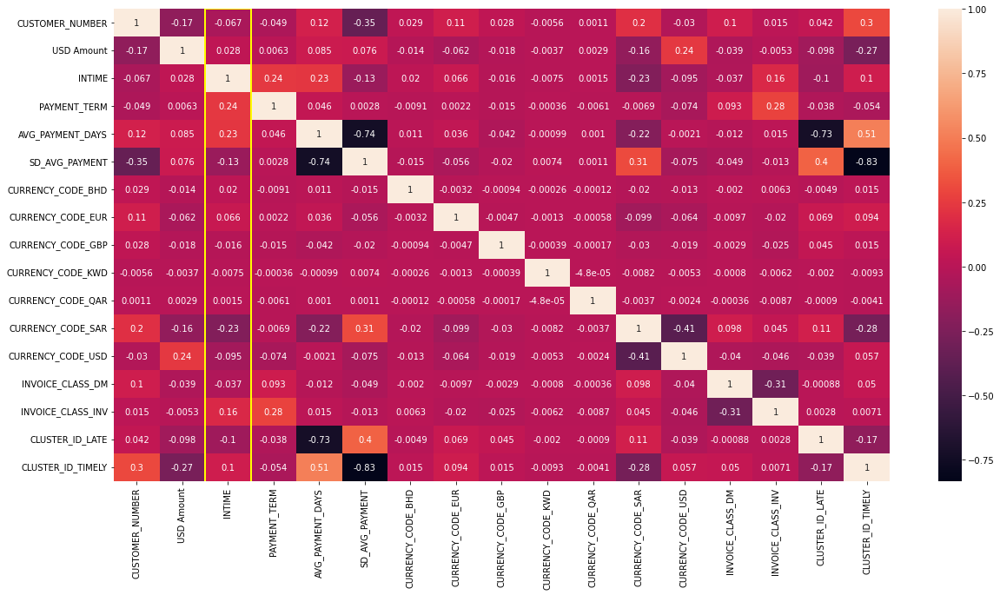

In [124]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
ax = sns.heatmap(merged_df.corr(),annot = True)
ax.add_patch(Rectangle((2,0), 1, merged_df.shape[1], fill=False, edgecolor='yellow', lw=2))
plt.show()

#### Even though we see correlation between the variables (AVG_PAYMENT_DAYS and	SD_AVG_PAYMENT), since these are our derived variables we can keep them.So we decide not to drop any variables. We will do the logistic regression modelling and then eliminate variables based on their significance or VIF

# Model Building

In [125]:
import statsmodels.api as sm

#### creating a funciton to get VIF

In [126]:
#Checking VIF
#creating a funciton to get VIF

def get_VIF(col):
    vif = pd.DataFrame()
    vif['Features'] = X_train[col].columns
    vif['VIF'] = [variance_inflation_factor(X_train[col].values,i) for i in range(X_train[col].shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    vif = vif.sort_values(by='VIF',ascending=False)
    return vif

In [127]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 INTIME   No. Observations:                64947
Model:                            GLM   Df Residuals:                    64931
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -32405.
Date:                Tue, 14 Feb 2023   Deviance:                       64809.
Time:                        09:32:00   Pearson chi2:                 1.84e+06
No. Iterations:                    21   Pseudo R-squ. (CS):             0.2518
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -135.4016      1.800    -75.227      0.000    -138.929    -131.874
USD Amount           -0.4639      0.123     -3.761      0.000      -0.706      -0.222
PAYMENT_TERM         87.0643      1.655     52.611      0.000      83.821      90.308
AVG_PAYMENT_DAYS     57.4671      0.919     62.550      0.000      55.666      59.268
SD_AVG_PAYMENT       12.4770      0.263     47.524      0.000      11.962      12.992
CURRENCY_CODE_BHD     1.4043      0.392      3.587      0.000       0.637       2.172
CURRENCY_CODE_EUR     0.0490      0.100      0.491      0.623      -0.147       0.244
CURRENCY_CODE_GBP    -0.5486      0.338     -1.625      0.104      -1.210       0.113
CURRENCY_CODE_KWD   -22.9940   1.56e+04     -0.001      0.999   -3.07e+04    3.06e+04
CURRENCY_CODE_QAR     2.2027      1.772      1.243      0.214      -1.270       5.675
CURRENCY_CODE_SAR    -1.2612      0.023    -54.750      0.000      -1.306      -1.216
CURRENCY_CODE_USD    -0.7977      0.027    -29.827      0.000      -0.850      -0.745
INVOICE_CLASS_DM      2.1229      0.217      9.779      0.000       1.697       2.548
INVOICE_CLASS_INV     2.7606      0.125     22.148      0.000       2.516       3.005
CLUSTER_ID_LATE       3.9296      0.117     33.688      0.000       3.701       4.158
CLUSTER_ID_TIMELY     1.1372      0.049     23.064      0.000       1.041       1.234
=====================================================================================
"""

In [128]:
### Feature Selection Using RFE

In [129]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [130]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg,n_features_to_select = 12)             # running RFE with 13 variables as output
rfe = rfe.fit(X_train, y_train)

In [131]:
rfe.support_

array([False,  True,  True,  True,  True, False,  True,  True, False,
        True,  True,  True,  True,  True,  True])

In [132]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('USD Amount', False, 3),
 ('PAYMENT_TERM', True, 1),
 ('AVG_PAYMENT_DAYS', True, 1),
 ('SD_AVG_PAYMENT', True, 1),
 ('CURRENCY_CODE_BHD', True, 1),
 ('CURRENCY_CODE_EUR', False, 4),
 ('CURRENCY_CODE_GBP', True, 1),
 ('CURRENCY_CODE_KWD', True, 1),
 ('CURRENCY_CODE_QAR', False, 2),
 ('CURRENCY_CODE_SAR', True, 1),
 ('CURRENCY_CODE_USD', True, 1),
 ('INVOICE_CLASS_DM', True, 1),
 ('INVOICE_CLASS_INV', True, 1),
 ('CLUSTER_ID_LATE', True, 1),
 ('CLUSTER_ID_TIMELY', True, 1)]

In [133]:
col = X_train.columns[rfe.support_]

In [134]:
X_train.columns[~rfe.support_]

Index(['USD Amount', 'CURRENCY_CODE_EUR', 'CURRENCY_CODE_QAR'], dtype='object')

In [135]:
##### Assessing the model with StatsModels

In [136]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 INTIME   No. Observations:                64947
Model:                            GLM   Df Residuals:                    64934
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -32413.
Date:                Tue, 14 Feb 2023   Deviance:                       64825.
Time:                        09:32:03   Pearson chi2:                 1.72e+06
No. Iterations:                    21   Pseudo R-squ. (CS):             0.2516
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -135.3502      1.798    -75.296      0.000    -138.873    -131.827
PAYMENT_TERM         87.2416      1.652     52.821      0.000      84.004      90.479
AVG_PAYMENT_DAYS     57.1464      0.910     62.779      0.000      55.362      58.931
SD_AVG_PAYMENT       12.5627      0.261     48.118      0.000      12.051      13.074
CURRENCY_CODE_BHD     1.4202      0.391      3.628      0.000       0.653       2.187
CURRENCY_CODE_GBP    -0.5551      0.338     -1.644      0.100      -1.217       0.107
CURRENCY_CODE_KWD   -22.9733   1.56e+04     -0.001      0.999   -3.06e+04    3.05e+04
CURRENCY_CODE_SAR    -1.2495      0.023    -54.964      0.000      -1.294      -1.205
CURRENCY_CODE_USD    -0.8201      0.026    -31.413      0.000      -0.871      -0.769
INVOICE_CLASS_DM      2.1088      0.217      9.739      0.000       1.684       2.533
INVOICE_CLASS_INV     2.7496      0.124     22.230      0.000       2.507       2.992
CLUSTER_ID_LATE       3.8983      0.116     33.618      0.000       3.671       4.126
CLUSTER_ID_TIMELY     1.2037      0.046     26.080      0.000       1.113       1.294
=====================================================================================
"""

# Checking VIF

In [137]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [138]:
#checking VIF
get_VIF(col)

,Features,VIF
0,PAYMENT_TERM,1399.07
1,AVG_PAYMENT_DAYS,1183.87
9,INVOICE_CLASS_INV,19.44
2,SD_AVG_PAYMENT,16.31
11,CLUSTER_ID_TIMELY,6.55
10,CLUSTER_ID_LATE,2.47
6,CURRENCY_CODE_SAR,2.18
7,CURRENCY_CODE_USD,1.54
8,INVOICE_CLASS_DM,1.17
4,CURRENCY_CODE_GBP,1.01


In [139]:
## Since we can see CURRENCY_CODE_KWD as highly insignificant we can drop these.We will drop one variable at time.


In [140]:
## Dropping RECEIPT_METHOD_I/C Check

In [141]:
col = col.drop('CURRENCY_CODE_KWD',1)
col

Index(['PAYMENT_TERM', 'AVG_PAYMENT_DAYS', 'SD_AVG_PAYMENT',
       'CURRENCY_CODE_BHD', 'CURRENCY_CODE_GBP', 'CURRENCY_CODE_SAR',
       'CURRENCY_CODE_USD', 'INVOICE_CLASS_DM', 'INVOICE_CLASS_INV',
       'CLUSTER_ID_LATE', 'CLUSTER_ID_TIMELY'],
      dtype='object')

In [142]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 INTIME   No. Observations:                64947
Model:                            GLM   Df Residuals:                    64935
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -32420.
Date:                Tue, 14 Feb 2023   Deviance:                       64840.
Time:                        09:32:04   Pearson chi2:                 1.72e+06
No. Iterations:                     7   Pseudo R-squ. (CS):             0.2515
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -135.3030      1.797    -75.291      0.000    -138.825    -131.781
PAYMENT_TERM         87.2120      1.651     52.816      0.000      83.976      90.448
AVG_PAYMENT_DAYS     57.1249      0.910     62.768      0.000      55.341      58.909
SD_AVG_PAYMENT       12.5532      0.261     48.096      0.000      12.042      13.065
CURRENCY_CODE_BHD     1.4206      0.391      3.629      0.000       0.653       2.188
CURRENCY_CODE_GBP    -0.5546      0.338     -1.643      0.100      -1.216       0.107
CURRENCY_CODE_SAR    -1.2483      0.023    -54.924      0.000      -1.293      -1.204
CURRENCY_CODE_USD    -0.8192      0.026    -31.384      0.000      -0.870      -0.768
INVOICE_CLASS_DM      2.1082      0.217      9.737      0.000       1.684       2.533
INVOICE_CLASS_INV     2.7494      0.124     22.231      0.000       2.507       2.992
CLUSTER_ID_LATE       3.8982      0.116     33.620      0.000       3.671       4.125
CLUSTER_ID_TIMELY     1.2031      0.046     26.073      0.000       1.113       1.294
=====================================================================================
"""

In [143]:
#checking VIF
get_VIF(col)

,Features,VIF
0,PAYMENT_TERM,1399.07
1,AVG_PAYMENT_DAYS,1183.86
8,INVOICE_CLASS_INV,19.44
2,SD_AVG_PAYMENT,16.31
10,CLUSTER_ID_TIMELY,6.55
9,CLUSTER_ID_LATE,2.47
5,CURRENCY_CODE_SAR,2.18
6,CURRENCY_CODE_USD,1.54
7,INVOICE_CLASS_DM,1.17
4,CURRENCY_CODE_GBP,1.01


In [144]:
## Since PAYMENT_TERM and AVG_PAYMENT_DAYS are correlated to the target 'INTIME', we will not drop those variables

### Making predictions on train set

In [145]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

3475     0.208286
25638    0.278331
3657     0.184161
54757    0.735012
17330    0.320328
82585    0.020325
31199    0.300822
28027    0.094046
48799    0.296998
36734    0.136373
dtype: float64

In [146]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.20828648, 0.27833068, 0.18416143, 0.73501235, 0.32032835,
       0.02032487, 0.30082199, 0.09404619, 0.29699813, 0.13637276])

In [147]:
##### Creating a dataframe with the actual INTIME flag and the predicted probabilities

In [148]:
y_train_pred_final = pd.DataFrame({'INTIME':y_train.values, 'INTIME_PROBABILTY':y_train_pred})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,INTIME,INTIME_PROBABILTY,CustID
0,0,0.208286,3475
1,0,0.278331,25638
2,0,0.184161,3657
3,0,0.735012,54757
4,0,0.320328,17330


In [149]:
y_train_pred_final['INTIME_PRED'] = y_train_pred_final.INTIME_PROBABILTY.map(lambda x: 1 if x > 0.5 else 0)
# Let's see the head
y_train_pred_final.head()

,INTIME,INTIME_PROBABILTY,CustID,INTIME_PRED
0,0,0.208286,3475,0
1,0,0.278331,25638,0
2,0,0.184161,3657,0
3,0,0.735012,54757,1
4,0,0.320328,17330,0


In [150]:
from sklearn import metrics

In [151]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.INTIME, y_train_pred_final.INTIME_PRED)
print(confusion)

[[36485  6086]
 [ 9703 12673]]


In [152]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.INTIME, y_train_pred_final.INTIME_PRED))

0.756894082867569


### Precision and recall tradeoff

In [153]:
from sklearn.metrics import precision_recall_curve

In [154]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.INTIME, y_train_pred_final.INTIME_PROBABILTY)

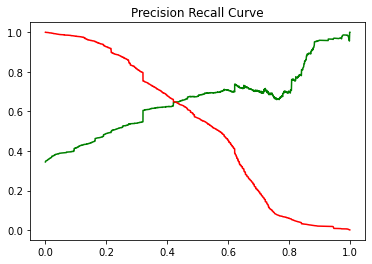

In [155]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.title("Precision Recall Curve")
plt.show()

### From the above Precision-Recall curve we can conclude 0.42 is an optimal cut off to make predictions.

### Making predictions on the test set

In [156]:
### X_test has already been transformed earlier. So continuing with prediction

In [157]:
X_test = X_test[col]
X_test.head()

,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CURRENCY_CODE_BHD,CURRENCY_CODE_GBP,CURRENCY_CODE_SAR,CURRENCY_CODE_USD,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
14598,0.923501,0.870923,0.048300,0,0,0,1,0,1,0,1
62844,0.915977,0.866759,0.053804,0,0,0,1,0,1,0,1
957,0.923501,0.861207,0.263901,0,0,1,0,0,1,0,0
73486,0.918234,0.820958,0.404103,0,0,0,0,0,1,0,0
18483,0.923501,0.861207,0.263901,0,0,1,0,0,1,0,0


In [158]:
X_test_sm = sm.add_constant(X_test)

In [159]:
y_test_pred = res.predict(X_test_sm)

In [160]:
y_test_pred[:10]

14598    0.218988
62844    0.109431
957      0.320328
73486    0.376931
18483    0.320328
74850    0.623245
33651    0.320328
50800    0.798656
37194    0.052427
3859     0.248919
dtype: float64

In [161]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [162]:
# Let's see the head
y_pred_1.head()

,0
14598,0.218988
62844,0.109431
957,0.320328
73486,0.376931
18483,0.320328


In [163]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [164]:
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

In [165]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [166]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [167]:
y_pred_final.head()

,INTIME,CustID,0
0,0,14598,0.218988
1,1,62844,0.109431
2,0,957,0.320328
3,1,73486,0.376931
4,0,18483,0.320328


In [168]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'INTIME_Prob'})

In [169]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['CustID','INTIME','INTIME_Prob'], axis=1)

In [170]:
# Let's see the head of y_pred_final
y_pred_final.head()

,CustID,INTIME,INTIME_Prob
0,14598,0,0.218988
1,62844,1,0.109431
2,957,0,0.320328
3,73486,1,0.376931
4,18483,0,0.320328


In [171]:
y_pred_final['INTIME_predicted'] = y_pred_final.INTIME_Prob.map(lambda x: 1 if x > 0.42 else 0)

In [172]:
y_pred_final.head()

,CustID,INTIME,INTIME_Prob,INTIME_predicted
0,14598,0,0.218988,0
1,62844,1,0.109431,0
2,957,0,0.320328,0
3,73486,1,0.376931,0
4,18483,0,0.320328,0


In [173]:
# Let's check the overall accuracy.
accuracy_test = metrics.accuracy_score(y_pred_final.INTIME, y_pred_final.INTIME_predicted)
accuracy_test

0.7587569606610383

In [174]:
confusion_test = metrics.confusion_matrix(y_pred_final.INTIME, y_pred_final.INTIME_predicted)
confusion_test

array([[14966,  3373],
       [ 3342,  6154]], dtype=int64)

In [175]:
TP = confusion_test[1,1] # true positive 
TN = confusion_test[0,0] # true negatives
FP = confusion_test[0,1] # false positives
FN = confusion_test[1,0] # false negatives

### Since for the problem in hand, the cost of False Positive is high.i.e. if the model predicts 1 (INTIME payment) for a 0 (Delayed Payment), then we would be missing out on targetting those customers and we might actually not get the payment on time. Hence PRECISION become important

### At the same time if we have a very high FN rate, predicting 0 (delayed payment) when acutally the customer might pay on time (1). Hence RECALL become important.

### So we have to balance between getting more True Positive and less False Negatives


In [176]:
## PRECISION

In [177]:
# Let's see the sensitivity of our logistic regression model
Precision = TP / float(TP+FP)
Precision

0.6459536055421434

In [178]:
## Recall

In [179]:
# Let us calculate specificity
RECALL = TP/float(TN+FN)
RECALL

0.33613720777802053

In [180]:
print('Accuracy Score :','\t',round(accuracy_test,2))
print('Precision :','\t\t',round(Precision,2))
print('RECALL :','\t\t',round(RECALL,2))

Accuracy Score : 	 0.76
Precision : 		 0.65
RECALL : 		 0.34


### Metrics

 - Accuracy Score : 	 0.76
 - Precision : 		 0.65
 - RECALL : 		 0.34

# Predicting on Open Invoice Data

In [181]:
open_df_original = open_df.copy()

In [182]:
open_df.head()

,AS_OF_DATE,Customer Type,Customer_Name,Customer Account No,Transaction Number,Transaction Date,Payment Term,Due Date,Transaction Currency,Local Amount,Transaction Class,AGE,USD Amount,INV_CREATION_DATE
0,04-APR-2022 01:07:01,3rd Party,GIVE Corp,49144.0,100210000438,21/12/2021,Immediate,21/12/2021,AED,"-3,088",CREDIT NOTE,105,"-3,088",12/21/2021 12:53
1,04-APR-2022 01:07:01,Related Party,AL J Corp,23152.0,100220000052,01/02/2022,30 Days from Inv Date,03/03/2022,USD,"2,000",INVOICE,33,"2,000",2/1/2022 14:09
2,04-APR-2022 01:07:01,Related Party,AL J Corp,23152.0,100220000143,24/03/2022,30 Days from Inv Date,23/04/2022,USD,"2,000",INVOICE,-18,"2,000",3/24/2022 17:46
3,04-APR-2022 01:07:01,Related Party,AL R Corp,23312.0,100220000001,04/01/2022,15 Days from Inv Date,19/01/2022,AED,"2,415",INVOICE,76,"2,415",1/5/2022 11:49
4,04-APR-2022 01:07:01,Related Party,ALLI Corp,7530.0,100220000105,03/03/2022,30 Days from EOM,30/04/2022,AED,"3,800",INVOICE,-25,"3,800",3/3/2022 22:30


In [183]:
open_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88204 entries, 0 to 88203
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   AS_OF_DATE            88204 non-null  object 
 1   Customer Type         88204 non-null  object 
 2   Customer_Name         88204 non-null  object 
 3   Customer Account No   88201 non-null  float64
 4   Transaction Number    88195 non-null  object 
 5   Transaction Date      88204 non-null  object 
 6   Payment Term          88204 non-null  object 
 7   Due Date              88204 non-null  object 
 8   Transaction Currency  88204 non-null  object 
 9   Local Amount          88204 non-null  object 
 10  Transaction Class     88204 non-null  object 
 11  AGE                   88204 non-null  int64  
 12  USD Amount            88204 non-null  object 
 13  INV_CREATION_DATE     88204 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 9.4+ MB


In [184]:
#renaming the columns to match the columns in the Received payment df.
open_df.rename(columns = {'Customer Account No':'CUSTOMER_NUMBER','Transaction Currency':'CURRENCY_CODE','Transaction Class':'INVOICE_CLASS','INV_CREATION_DATE':'INVOICE_CREATION_DATE','Due Date':'DUE_DATE','Customer_Name':'CUSTOMER_NAME'}, inplace = True)

In [185]:
#dropping columns that are not relevant
open_df.drop(columns = ['Customer Type','Transaction Number','Transaction Date'],axis=1,inplace=True)

In [186]:
open_df['USD Amount'].head()

0    -3,088
1     2,000
2     2,000
3     2,415
4     3,800
Name: USD Amount, dtype: object

In [187]:
open_df['USD Amount'] = open_df['USD Amount'].str.replace(',', '').astype(float)

In [188]:
#change date columns to datetime
open_df[['INVOICE_CREATION_DATE','DUE_DATE','AS_OF_DATE']] = open_df[['INVOICE_CREATION_DATE','DUE_DATE','AS_OF_DATE']].apply(pd.to_datetime,errors='coerce')

In [189]:
open_df['PAYMENT_TERM'] = (open_df['DUE_DATE'] - open_df['INVOICE_CREATION_DATE']).dt.days

In [190]:
open_df.drop(columns = ['Payment Term'],axis=1,inplace=True)

In [191]:
open_df.head()

,AS_OF_DATE,CUSTOMER_NAME,CUSTOMER_NUMBER,DUE_DATE,CURRENCY_CODE,Local Amount,INVOICE_CLASS,AGE,USD Amount,INVOICE_CREATION_DATE,PAYMENT_TERM
0,2022-04-04 01:07:01,GIVE Corp,49144.0,2021-12-21,AED,"-3,088",CREDIT NOTE,105,-3088.0,2021-12-21 12:53:00,-1
1,2022-04-04 01:07:01,AL J Corp,23152.0,2022-03-03,USD,"2,000",INVOICE,33,2000.0,2022-02-01 14:09:00,29
2,2022-04-04 01:07:01,AL J Corp,23152.0,2022-04-23,USD,"2,000",INVOICE,-18,2000.0,2022-03-24 17:46:00,29
3,2022-04-04 01:07:01,AL R Corp,23312.0,2022-01-19,AED,"2,415",INVOICE,76,2415.0,2022-01-05 11:49:00,13
4,2022-04-04 01:07:01,ALLI Corp,7530.0,2022-04-30,AED,"3,800",INVOICE,-25,3800.0,2022-03-03 22:30:00,57


In [192]:
open_df.INVOICE_CLASS = open_df.INVOICE_CLASS.apply(lambda x : 'CM' if x == 'CREDIT NOTE' else('DM' if x=='DEBIT NOTE' else 'INV'))

In [193]:
open_df.isnull().sum()

AS_OF_DATE               0
CUSTOMER_NAME            0
CUSTOMER_NUMBER          3
DUE_DATE                 0
CURRENCY_CODE            0
Local Amount             0
INVOICE_CLASS            0
AGE                      0
USD Amount               0
INVOICE_CREATION_DATE    0
PAYMENT_TERM             0
dtype: int64

In [194]:
#dropping rows with null values  in 'RECEIPT_DOC_NO' column
open_df = open_df[open_df['CUSTOMER_NUMBER'].notna()]

In [195]:
## Taking dataframe slice with only age negative
open_df[(open_df['AGE'] > 0)]['INVOICE_CLASS']

0         CM
1        INV
3        INV
19       INV
20       INV
21       INV
23       INV
24       INV
25       INV
26        CM
27       INV
28       INV
29       INV
30       INV
31       INV
32       INV
33       INV
34       INV
35       INV
36       INV
37       INV
54       INV
55       INV
56       INV
57       INV
58       INV
59       INV
60       INV
64       INV
65       INV
66       INV
67       INV
68       INV
69       INV
70       INV
71       INV
72       INV
73       INV
80       INV
81       INV
82       INV
83       INV
84       INV
85       INV
86        CM
87       INV
88       INV
89       INV
90       INV
91       INV
92       INV
93       INV
95       INV
96       INV
97       INV
98       INV
99       INV
100      INV
101      INV
102       CM
103      INV
104      INV
105      INV
107      INV
108      INV
109      INV
110      INV
111      INV
112      INV
113       CM
114      INV
115      INV
116      INV
117      INV
118      INV
119      INV
120      INV

In [196]:
open_df.INVOICE_CLASS.unique()

array(['CM', 'INV', 'DM'], dtype=object)

In [197]:
### creating df to be fit to the Kmeans

In [198]:
open_clustering_df = open_df [['CUSTOMER_NAME','AS_OF_DATE','USD Amount','INVOICE_CREATION_DATE','DUE_DATE','PAYMENT_TERM']]

In [199]:
open_clustering_df.head()

,CUSTOMER_NAME,AS_OF_DATE,USD Amount,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM
0,GIVE Corp,2022-04-04 01:07:01,-3088.0,2021-12-21 12:53:00,2021-12-21,-1
1,AL J Corp,2022-04-04 01:07:01,2000.0,2022-02-01 14:09:00,2022-03-03,29
2,AL J Corp,2022-04-04 01:07:01,2000.0,2022-03-24 17:46:00,2022-04-23,29
3,AL R Corp,2022-04-04 01:07:01,2415.0,2022-01-05 11:49:00,2022-01-19,13
4,ALLI Corp,2022-04-04 01:07:01,3800.0,2022-03-03 22:30:00,2022-04-30,57


In [200]:
open_clustering_df['PAYMENT_DAYS'] = (open_clustering_df['DUE_DATE'] - open_clustering_df['AS_OF_DATE']).dt.days

In [201]:
open_clustering_df['AVG_PAYMENT_DAYS'] = round(open_clustering_df.groupby(by='CUSTOMER_NAME')['PAYMENT_DAYS'].transform('mean'))

In [202]:
open_clustering_df['SD_AVG_PAYMENT'] = open_clustering_df.groupby(by='CUSTOMER_NAME')['PAYMENT_DAYS'].transform(np.std)

In [203]:
open_clstr = open_clustering_df[['CUSTOMER_NAME','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']]

In [204]:
open_clstr.head()

,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT
0,GIVE Corp,-62.0,139.351974
1,AL J Corp,-23.0,250.176954
2,AL J Corp,-23.0,250.176954
3,AL R Corp,2.0,125.970114
4,ALLI Corp,-13.0,95.350666


In [205]:
open_clstr.fillna(0,inplace=True)

In [206]:
open_clstr_SS = scaler_sd.transform(open_clstr.iloc[:,1:])

In [207]:
open_clstr_SS = pd.DataFrame(open_clstr_SS)

In [208]:
open_clstr.isnull().sum()

CUSTOMER_NAME       0
AVG_PAYMENT_DAYS    0
SD_AVG_PAYMENT      0
dtype: int64

In [209]:
open_clstr_SS.head()

,0,1
0,0.052532,-0.053199
1,0.585439,0.992732
2,0.585439,0.992732
3,0.927046,-0.179493
4,0.722082,-0.468470


In [210]:
### Final model with K=4
#kmeans = KMeans(n_clusters=4,max_iter =50,random_state=100)
kmeans.fit(open_clstr_SS)

KMeans(max_iter=50, n_clusters=4, random_state=100)

In [211]:
kmeans.labels_

array([0, 0, 0, ..., 0, 1, 1])

In [212]:
open_clstr['CLUSTER_ID'] = kmeans.labels_

In [213]:
open_clstr.head()

,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,GIVE Corp,-62.0,139.351974,0
1,AL J Corp,-23.0,250.176954,0
2,AL J Corp,-23.0,250.176954,0
3,AL R Corp,2.0,125.970114,0
4,ALLI Corp,-13.0,95.350666,0


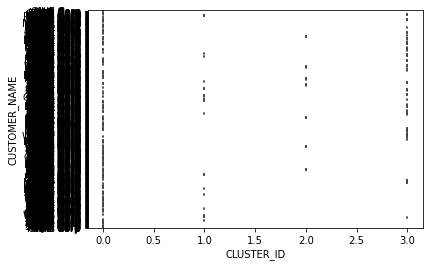

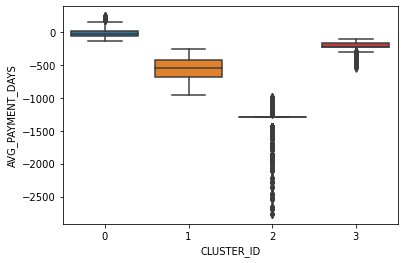

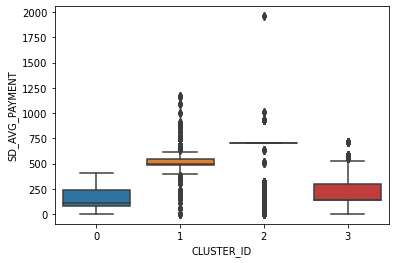

In [214]:
for c in open_clstr.columns:
    if c != 'CLUSTER_ID':
        sns.boxplot(x='CLUSTER_ID',y= c,data=open_clstr)
        plt.show()

In [215]:
merged_open_df = pd.merge(open_df, open_clstr[['AVG_PAYMENT_DAYS','SD_AVG_PAYMENT','CLUSTER_ID']], left_index=True, right_index=True)

In [216]:
merged_open_df.head()

,AS_OF_DATE,CUSTOMER_NAME,CUSTOMER_NUMBER,DUE_DATE,CURRENCY_CODE,Local Amount,INVOICE_CLASS,AGE,USD Amount,INVOICE_CREATION_DATE,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,2022-04-04 01:07:01,GIVE Corp,49144.0,2021-12-21,AED,"-3,088",CM,105,-3088.0,2021-12-21 12:53:00,-1,-62.0,139.351974,0
1,2022-04-04 01:07:01,AL J Corp,23152.0,2022-03-03,USD,"2,000",INV,33,2000.0,2022-02-01 14:09:00,29,-23.0,250.176954,0
2,2022-04-04 01:07:01,AL J Corp,23152.0,2022-04-23,USD,"2,000",INV,-18,2000.0,2022-03-24 17:46:00,29,-23.0,250.176954,0
3,2022-04-04 01:07:01,AL R Corp,23312.0,2022-01-19,AED,"2,415",INV,76,2415.0,2022-01-05 11:49:00,13,2.0,125.970114,0
4,2022-04-04 01:07:01,ALLI Corp,7530.0,2022-04-30,AED,"3,800",INV,-25,3800.0,2022-03-03 22:30:00,57,-13.0,95.350666,0


In [217]:
merged_open_df.CLUSTER_ID = merged_open_df.CLUSTER_ID.apply(lambda x : 'TIMELY' if x == 0 else('LATE' if x==2 else 'CANTSAY'))

In [218]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy_open_df = pd.get_dummies(merged_open_df[['CURRENCY_CODE', 'INVOICE_CLASS','CLUSTER_ID']], drop_first=True)

In [219]:
# Adding the results to the master dataframe
merged_open_df = pd.concat([merged_open_df, dummy_open_df], axis=1)

In [220]:
merged_open_df.drop(columns = ['CURRENCY_CODE', 'INVOICE_CLASS','CLUSTER_ID'],axis=1,inplace=True)

In [221]:
merged_open_df.head()

,AS_OF_DATE,CUSTOMER_NAME,CUSTOMER_NUMBER,DUE_DATE,Local Amount,AGE,USD Amount,INVOICE_CREATION_DATE,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CURRENCY_CODE_BHD,CURRENCY_CODE_CNY,CURRENCY_CODE_EGP,CURRENCY_CODE_EUR,CURRENCY_CODE_GBP,CURRENCY_CODE_HKD,CURRENCY_CODE_JOD,CURRENCY_CODE_KWD,CURRENCY_CODE_MAD,CURRENCY_CODE_OMR,CURRENCY_CODE_QAR,CURRENCY_CODE_SAR,CURRENCY_CODE_SGD,CURRENCY_CODE_USD,CURRENCY_CODE_ZAR,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
0,2022-04-04 01:07:01,GIVE Corp,49144.0,2021-12-21,"-3,088",105,-3088.0,2021-12-21 12:53:00,-1,-62.0,139.351974,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,2022-04-04 01:07:01,AL J Corp,23152.0,2022-03-03,"2,000",33,2000.0,2022-02-01 14:09:00,29,-23.0,250.176954,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
2,2022-04-04 01:07:01,AL J Corp,23152.0,2022-04-23,"2,000",-18,2000.0,2022-03-24 17:46:00,29,-23.0,250.176954,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
3,2022-04-04 01:07:01,AL R Corp,23312.0,2022-01-19,"2,415",76,2415.0,2022-01-05 11:49:00,13,2.0,125.970114,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,2022-04-04 01:07:01,ALLI Corp,7530.0,2022-04-30,"3,800",-25,3800.0,2022-03-03 22:30:00,57,-13.0,95.350666,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


In [222]:
#Assigning the columns for the final prediction
X_Final = merged_open_df[['CUSTOMER_NAME','CUSTOMER_NUMBER','USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT','CURRENCY_CODE_BHD','CURRENCY_CODE_EUR','CURRENCY_CODE_GBP','CURRENCY_CODE_KWD','CURRENCY_CODE_QAR','CURRENCY_CODE_SAR','CURRENCY_CODE_USD','INVOICE_CLASS_DM','INVOICE_CLASS_INV','CLUSTER_ID_LATE','CLUSTER_ID_TIMELY']]
X_Final.head()

,CUSTOMER_NAME,CUSTOMER_NUMBER,USD Amount,PAYMENT_TERM,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CURRENCY_CODE_BHD,CURRENCY_CODE_EUR,CURRENCY_CODE_GBP,CURRENCY_CODE_KWD,CURRENCY_CODE_QAR,CURRENCY_CODE_SAR,CURRENCY_CODE_USD,INVOICE_CLASS_DM,INVOICE_CLASS_INV,CLUSTER_ID_LATE,CLUSTER_ID_TIMELY
0,GIVE Corp,49144.0,-3088.0,-1,-62.0,139.351974,0,0,0,0,0,0,0,0,0,0,1
1,AL J Corp,23152.0,2000.0,29,-23.0,250.176954,0,0,0,0,0,0,1,0,1,0,1
2,AL J Corp,23152.0,2000.0,29,-23.0,250.176954,0,0,0,0,0,0,1,0,1,0,1
3,AL R Corp,23312.0,2415.0,13,2.0,125.970114,0,0,0,0,0,0,0,0,1,0,1
4,ALLI Corp,7530.0,3800.0,57,-13.0,95.350666,0,0,0,0,0,0,0,0,1,0,1


In [223]:
X_Final[['USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']] = scaler.transform(X_Final[['USD Amount','PAYMENT_TERM','AVG_PAYMENT_DAYS','SD_AVG_PAYMENT']])

In [224]:
X_Final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88201 entries, 0 to 88203
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUSTOMER_NAME      88201 non-null  object 
 1   CUSTOMER_NUMBER    88201 non-null  float64
 2   USD Amount         88201 non-null  float64
 3   PAYMENT_TERM       88201 non-null  float64
 4   AVG_PAYMENT_DAYS   88201 non-null  float64
 5   SD_AVG_PAYMENT     88201 non-null  float64
 6   CURRENCY_CODE_BHD  88201 non-null  uint8  
 7   CURRENCY_CODE_EUR  88201 non-null  uint8  
 8   CURRENCY_CODE_GBP  88201 non-null  uint8  
 9   CURRENCY_CODE_KWD  88201 non-null  uint8  
 10  CURRENCY_CODE_QAR  88201 non-null  uint8  
 11  CURRENCY_CODE_SAR  88201 non-null  uint8  
 12  CURRENCY_CODE_USD  88201 non-null  uint8  
 13  INVOICE_CLASS_DM   88201 non-null  uint8  
 14  INVOICE_CLASS_INV  88201 non-null  uint8  
 15  CLUSTER_ID_LATE    88201 non-null  uint8  
 16  CLUSTER_ID_TIMELY  882

In [225]:
col

Index(['PAYMENT_TERM', 'AVG_PAYMENT_DAYS', 'SD_AVG_PAYMENT',
       'CURRENCY_CODE_BHD', 'CURRENCY_CODE_GBP', 'CURRENCY_CODE_SAR',
       'CURRENCY_CODE_USD', 'INVOICE_CLASS_DM', 'INVOICE_CLASS_INV',
       'CLUSTER_ID_LATE', 'CLUSTER_ID_TIMELY'],
      dtype='object')

In [226]:
X_Final_sm = sm.add_constant(X_Final[col])

In [227]:
y_Final = res.predict(X_Final_sm)
y_Final[:10]

0    0.030471
1    0.944287
2    0.944287
3    0.866716
4    0.838065
5    0.838065
6    0.799217
7    0.799217
8    0.799217
9    0.799217
dtype: float64

In [228]:
y_Final.shape

(88201,)

In [229]:
y_Final = pd.DataFrame(y_Final)

In [230]:
#Concatenating the prediction to the original open_Invoice dataframe to view the predication for each invoice
open_df_final_prediction = pd.concat([open_df_original, y_Final],axis=1)

In [231]:
open_df_final_prediction= open_df_final_prediction.rename(columns={ 0 : 'INTIME_Prob'})

In [232]:
open_df_final_prediction['INTIME_predicted'] = open_df_final_prediction.INTIME_Prob.map(lambda x: 1 if x > 0.42 else 0)

In [233]:
open_df_final_prediction['INTIME_predicted'].value_counts()

0    47025
1    41179
Name: INTIME_predicted, dtype: int64

In [234]:
#Concatenating the clustering data to the original open_Invoice dataframe to view the predication for each invoice
open_df_final_prediction = pd.concat([open_df_final_prediction,open_clstr], axis =1)

In [235]:
open_df_final_prediction.head()

,AS_OF_DATE,Customer Type,Customer_Name,Customer Account No,Transaction Number,Transaction Date,Payment Term,Due Date,Transaction Currency,Local Amount,Transaction Class,AGE,USD Amount,INV_CREATION_DATE,INTIME_Prob,INTIME_predicted,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,04-APR-2022 01:07:01,3rd Party,GIVE Corp,49144.0,100210000438,21/12/2021,Immediate,21/12/2021,AED,"-3,088",CREDIT NOTE,105,"-3,088",12/21/2021 12:53,0.030471,0,GIVE Corp,-62.0,139.351974,0.0
1,04-APR-2022 01:07:01,Related Party,AL J Corp,23152.0,100220000052,01/02/2022,30 Days from Inv Date,03/03/2022,USD,"2,000",INVOICE,33,"2,000",2/1/2022 14:09,0.944287,1,AL J Corp,-23.0,250.176954,0.0
2,04-APR-2022 01:07:01,Related Party,AL J Corp,23152.0,100220000143,24/03/2022,30 Days from Inv Date,23/04/2022,USD,"2,000",INVOICE,-18,"2,000",3/24/2022 17:46,0.944287,1,AL J Corp,-23.0,250.176954,0.0
3,04-APR-2022 01:07:01,Related Party,AL R Corp,23312.0,100220000001,04/01/2022,15 Days from Inv Date,19/01/2022,AED,"2,415",INVOICE,76,"2,415",1/5/2022 11:49,0.866716,1,AL R Corp,2.0,125.970114,0.0
4,04-APR-2022 01:07:01,Related Party,ALLI Corp,7530.0,100220000105,03/03/2022,30 Days from EOM,30/04/2022,AED,"3,800",INVOICE,-25,"3,800",3/3/2022 22:30,0.838065,1,ALLI Corp,-13.0,95.350666,0.0


## Deriving Insights from the Predications

#### 1. From our clustering analysis we can make the following infrence
- Customers in cluster 2 has the highest average payment days, so that might be the ones that make a late payement
- Customers in cluster 1 has the second highest average payment days followed by cluster 3.
- Customers in cluster 0 have the lowest average payment days and are more likely to make payements on time.

#### We intend to use the above inference along with the  predictions from the logistic regression to make decisions on which  customers to focus.

In [236]:
### 2. Invoices that are predicted to do make a late payement as per the logistic regression model alone

In [237]:
open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 0].head()

,AS_OF_DATE,Customer Type,Customer_Name,Customer Account No,Transaction Number,Transaction Date,Payment Term,Due Date,Transaction Currency,Local Amount,Transaction Class,AGE,USD Amount,INV_CREATION_DATE,INTIME_Prob,INTIME_predicted,CUSTOMER_NAME,AVG_PAYMENT_DAYS,SD_AVG_PAYMENT,CLUSTER_ID
0,04-APR-2022 01:07:01,3rd Party,GIVE Corp,49144.0,100210000438,21/12/2021,Immediate,21/12/2021,AED,"-3,088",CREDIT NOTE,105,"-3,088",12/21/2021 12:53,0.030471,0,GIVE Corp,-62.0,139.351974,0.0
24,04-APR-2022 01:07:01,Related Party,FACE Corp,7544.0,100210000385,06/12/2021,30 Days from Inv Date,05/01/2022,AED,317,INVOICE,90,317,12/6/2021 17:28,0.040409,0,FACE Corp,-169.0,128.789718,3.0
25,04-APR-2022 01:07:01,Related Party,FACE Corp,7544.0,100220000066,02/02/2022,30 Days from Inv Date,04/03/2022,USD,"2,000",INVOICE,32,"2,000",2/3/2022 10:48,0.002760,0,FACE Corp,-169.0,128.789718,3.0
54,04-APR-2022 01:07:01,Related Party,HABC Corp,1044.0,100210000328,11/11/2021,30 Days from Inv Date,11/12/2021,AED,637,INVOICE,115,637,11/14/2021 10:24,0.007119,0,HABC Corp,-335.0,542.132943,1.0
55,04-APR-2022 01:07:01,Related Party,HABC Corp,1044.0,100210000339,11/11/2021,30 Days from Inv Date,11/12/2021,AED,39,INVOICE,115,39,11/14/2021 10:24,0.007119,0,HABC Corp,-335.0,542.132943,1.0


In [238]:
### There are 47025 transaction that are predicted to do a late payement. That is about 53.3% of the total transactions

In [239]:
open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 0].shape

(47025, 20)

In [240]:
len(open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 0])/len(open_df_final_prediction)*100

53.31390866627363

In [241]:
Late_Logistic = open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 0][['Customer_Name','Transaction Number']]

In [242]:
Late_Logistic.head()

,Customer_Name,Transaction Number
0,GIVE Corp,100210000438
24,FACE Corp,100210000385
25,FACE Corp,100220000066
54,HABC Corp,100210000328
55,HABC Corp,100210000339


In [243]:
#### Transactions that are predicted by the logistic regression to make the payment on time.

In [244]:
Ontime_Logistic = open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 1][['Customer_Name','Transaction Number']]

### Now let us combine the clustering output along with Logistic regression output to make some refinment to our predictions

#### We are combining the cluster ID and final predication to get the invoices that will be paid on time
#### INTIME_predicted = 1 and CLUSTER_ID = 0 (the cluster that had the least AVERAGE PAYMENT DAYS)

In [245]:
Ontime_hybrid = open_df_final_prediction[(open_df_final_prediction.INTIME_predicted == 1) & (open_df_final_prediction.CLUSTER_ID == 0)]

#### We can see about 39082 customer invoices are predicated to be paid on time.

In [246]:
Ontime_hybrid.shape

(39082, 20)

#### We are combining the cluster ID and final predication to get the invoices that will be paid on time
#### INTIME_predicted = 0 and CLUSTER_ID = 2 (the cluster that had the highest AVERAGE PAYMENT DAYS)

In [247]:
Late_hybrid_Priority_1 = open_df_final_prediction[(open_df_final_prediction.INTIME_predicted == 0) & (open_df_final_prediction.CLUSTER_ID == 2)]

#### We can see about 2212 customer invoices are predicated to be late.

In [248]:
Late_hybrid_Priority_1.shape

(2212, 20)

#### We are combining the cluster ID and final predication to get the invoices that could be a risk for late payement
#### INTIME_predicted = 0 and CLUSTER_ID = 1 (the cluster that had the second highest AVERAGE PAYMENT DAYS)

In [249]:
Late_hybrid_Priority_2 = open_df_final_prediction[(open_df_final_prediction.INTIME_predicted == 0) & (open_df_final_prediction.CLUSTER_ID == 1)]

In [250]:
Late_hybrid_Priority_2.shape

(9000, 20)

#### We are combining the cluster ID and final predication to get the invoices that could be a risk for late payement
#### INTIME_predicted = 0 and CLUSTER_ID = 3 (the cluster that had the second lowest AVERAGE PAYMENT DAYS)

In [251]:
Late_hybrid_Priority_3 = open_df_final_prediction[(open_df_final_prediction.INTIME_predicted == 0) & (open_df_final_prediction.CLUSTER_ID == 3)]

In [252]:
Late_hybrid_Priority_3.shape

(29553, 20)

#### We are combining the cluster ID and final predication to get the invoices that could be a risk for late payement
#### INTIME_predicted = 0 and CLUSTER_ID = 0 (the cluster that had the lowest AVERAGE PAYMENT DAYS)

In [253]:
Late_hybrid_Priority_4 = open_df_final_prediction[(open_df_final_prediction.INTIME_predicted == 0) & (open_df_final_prediction.CLUSTER_ID == 0)]

In [254]:
Late_hybrid_Priority_4.shape

(6257, 20)

## Based on above analysis we have prioritized the transactions that we need our teams to focus on reaching out to push them to make the payments
- The below dataframes contain the details of the Customers and Transactions that we need to focus on in the order mentioned below
    - Late_hybrid_Priority_1
    - Late_hybrid_Priority_2
    - Late_hybrid_Priority_3
    - Late_hybrid_Priority_4

### Analysing the customers that have the highest predicted late payment Transactions

In [255]:
Late_Customers = open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 0][['Customer_Name']]

#### Top 20 customers who have the most transactions that are predicted to be late.

In [256]:
Late_Customers.Customer_Name.value_counts()[:20]

ETIH Corp    11106
FACE Corp     6344
PUIG Corp     2964
YOUG Corp     2352
CHRI Corp     1729
PARI Corp     1677
QATA Corp     1357
HABC Corp     1355
LUXU Corp     1048
SEPH Corp      913
MACH Corp      896
PARF Corp      870
RETA Corp      867
FITR Corp      742
FEND Corp      738
PCD  Corp      674
MAC  Corp      579
CWF  Corp      468
LIFE Corp      463
FUN  Corp      365
Name: Customer_Name, dtype: int64

#### Analysing the customers that have the highest predicted Ontime payment Transactions

In [257]:
Ontime_Customers = open_df_final_prediction[open_df_final_prediction.INTIME_predicted == 1][['Customer_Name']]

In [258]:
Ontime_Customers.Customer_Name.value_counts()[:20]

SEPH Corp    10334
FITR Corp     6593
PARF Corp     4298
ALLI Corp     2011
AREE Corp     1215
RADW Corp     1073
LOCC Corp      906
DEBE Corp      902
AL T Corp      689
CARR Corp      568
AL S Corp      455
SAUD Corp      449
LULU Corp      414
STYL Corp      362
CGR  Corp      342
AL R Corp      327
VAVA Corp      309
CHAU Corp      290
AL F Corp      268
PAND Corp      254
Name: Customer_Name, dtype: int64

#### We can also stratergize to reach the customers that are in general have the most transactions that are predicted as late payment.

# Insights from EDA

# Recommendations based on the derived insights:

### 1. From our clustering analysis we can make the following infrence
- Customers in cluster 2 has the highest average payment days, so that might be the ones that make a late payement
- Customers in cluster 1 has the second highest average payment days followed by cluster 3.
- Customers in cluster 0 have the lowest average payment days and are more likely to make payements on time.

#### We intend to use the above inference along with the  predictions from the logistic regression to make decisions on which  customers to focus.

### 2. After analysing the predictions from logistic regression and clustering and combining the data. We have priotized the transaction that need to be focused to avoid late payment
- The below dataframes contain the details of the Customers and Transactions that we need to focus on in the order mentioned below
    - Late_hybrid_Priority_1
    - Late_hybrid_Priority_2
    - Late_hybrid_Priority_3
    - Late_hybrid_Priority_4

In [259]:
Late_hybrid_Priority_1.to_excel('Late_hybrid_Priority_1.xlsx')
Late_hybrid_Priority_2.to_excel('Late_hybrid_Priority_2.xlsx')
Late_hybrid_Priority_3.to_excel('Late_hybrid_Priority_3.xlsx')
Late_hybrid_Priority_4.to_excel('Late_hybrid_Priority_4.xlsx')

### 3. Based on the number of transactions that were predicted as Ontime or Late we have made a list of customers who have the highest transactions for each prediction. We should focus on the customers with the hightest transactions that are predicated late, this ensures that we can get a large volume of payments to be done on time

In [260]:
Late_Customers.to_excel('Late_Customers.xlsx')
Ontime_Customers.to_excel('Ontime_Customers.xlsx')